In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#plot_n_b_psth.ipynb
#plot neural and behavior psth

import scipy.io as sio
import scipy.stats as sio_stat
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt 

import os
import pickle
import sys
import copy

import time
import pylab as pl
from IPython import display

from bmi_dynamics_code import behavior_co_obs as bmi_b
from bmi_dynamics_code import data_for_v as preeyacode
from bmi_dynamics_code import util as bmi_util

import timeit
from sklearn import decomposition as skl_decomp

%matplotlib notebook

In [3]:
%matplotlib notebook

In [4]:
# data_dir = '/Users/vivekathalye/Dropbox/Code/preeya_co_obstacle'
save_dir = r'D:\Dropbox\BMI_co_obs_paper\data\vivek\psth'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

home_dir = r'D:\Dropbox\Code\preeya_co_obstacle'
data_dir = r'D:\Dropbox\Data\preeya_co_obstacle'
data_path = os.path.join(data_dir, 'for_v_df.pkl')
print(os.path.exists(data_path))
d = pickle.load(open(data_path))

#UNPACK: 
decoder = d['decoder']
pre = d['pre']
num_targets = d['num_targets']
sample_period = d['sample_period']
target_hold_time = d['target_hold_time']
num_neurons = d['num_neurons']
target_color = d['target_color']
obs_big = d['obs_big']
obs_small = d['obs_small']
target_r_task = d['target_r_task'] #target_r_task = {0:1.7, 1:2.0}
cursor_r = d['cursor_r']
target_r_eff = d['target_r_eff']
target_pos = d['target_pos']
target_angle = np.arctan2(target_pos[:,1], target_pos[:,0])
target_dist = np.linalg.norm(target_pos, axis=1)
obs_pos = d['obs_pos']

tc_meta = d['tc_meta']
task_list = d['task_list']
num_tasks = len(task_list)
task2idx = d['task2idx']
idx2task = bmi_util.invert_dic(task2idx)
task2tc = d['task2tc']
tc_list = d['tc_list']
df = d['df']
df_label = d['df_label']

task_color = ['k', 'r']

True


In [5]:
#Plot the targets and obstacles: 
plot_task = False

plot_target = True
plot_obs_big = True
plot_obs_small = True
if plot_task:
    plot = {}
    plot['size'] = (10,10)
    plot['xlim'] = (-12.5,12.5)
    plot['ylim'] = (-12.5,12.5)

    plt.figure(figsize=plot['size'])

    if plot_obs_small:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
    if plot_obs_big:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
    if plot_target: 
        bmi_util.plot_targets(target_pos, target_color, target_r*np.ones(num_targets))                
    plt.axis('square')
    plt.xlim(plot['xlim'])
    plt.ylim(plot['ylim'])
    plt.show()


<IPython.core.display.Javascript object>


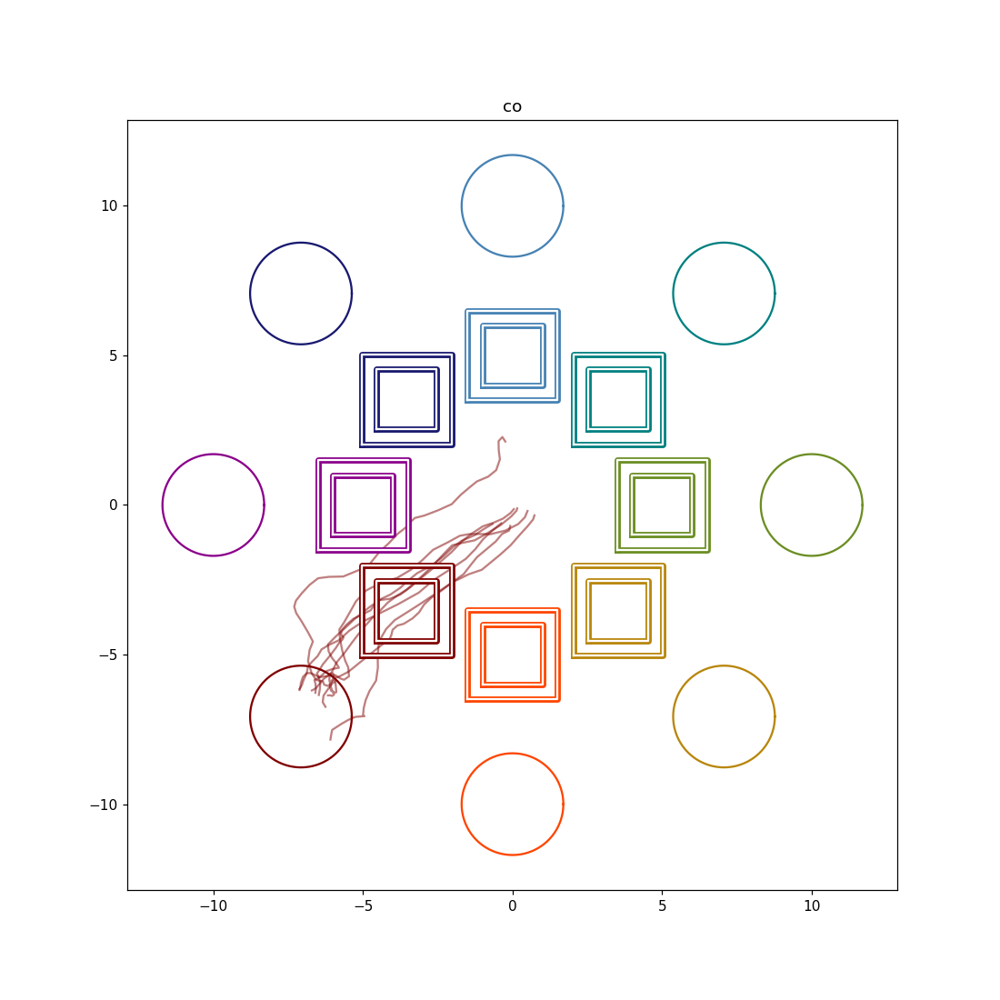

In [6]:
#PLOT INDIVIDUAL TRIALS: 
plot={}
plot['size'] = (10,10)
plot['xlim'] = (-12.5,12.5)
plot['ylim'] = (-12.5,12.5)

for task_i, task_str in enumerate(['co']): #task_list:
    task = task2idx[task_str]
    plt.figure(figsize=plot['size'])
    for target in [0]:#range(num_targets):
        sel = (df['task']==task) & (df['bin']>=0) & (df['target']==target)
        df_sel = df[sel]
        #------------------------------------------------------------------------------------
        #TRIALS: 
        trial_start = np.where(df_sel['bin']==0)[0]
        trial_stop = np.hstack((trial_start[1:]-1, len(np.where(sel)[0])))
        trial_bound = np.vstack((trial_start,trial_stop)).T
        #------------------------------------------------------------------------------------
        for bnd in trial_bound[:,:]: #trial_bound[0:1,:]:
            x = df_sel['kin_px'][bnd[0]:bnd[1]+1]
            y = df_sel['kin_py'][bnd[0]:bnd[1]+1]
#             print(x)
            color = target_color[target]
            plt.plot(x,y,'-',color=color,alpha=0.5)

    if plot_obs_small:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
    if plot_obs_big:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
    if plot_target: 
        bmi_util.plot_targets(target_pos, target_color, target_r_task[task_i]*np.ones(num_targets))  
    
    plt.axis('square')
    plt.title(task_str)
#     plt.xlim(plot['xlim'])
#     plt.ylim(plot['ylim'])
    plt.show()

In [7]:
#FORM: xarray for variable x time x trial: 
num_var = df.shape[1]
time_win = np.array([0, 80])
num_time = np.diff(time_win)[0]
da_dic = {}
for task_str in task_list:
    task = task2idx[task_str]
    for target in range(num_targets):
        sel = (df['task']==task) & (df['bin']>=0) & (df['target']==target)
        df_sel = df[sel]
        #------------------------------------------------------------------------------------
        #TRIALS: 
        trial_start = np.where(df_sel['bin']==0)[0]
        trial_stop = np.hstack((trial_start[1:]-1, len(np.where(sel)[0])))
        trial_bound = np.vstack((trial_start,trial_stop)).T
        num_trials = trial_bound.shape[0]
        #------------------------------------------------------------------------------------
        #Initialize a nan-filled xarray
        nan_mat = np.ones((num_var, num_time, num_trials))*np.nan
        da = xr.DataArray(nan_mat,
                    coords={'var':list(df.columns),
                                     'time':range(num_time),
                                     'trial':range(num_trials)},
                    dims=['var','time','trial'])
        for trial, bnd in enumerate(trial_bound): #trial_bound[0:1,:]:
            trial_len = bnd[1]-bnd[0]
            if trial_len <= num_time:
                bnd[1] = bnd[0] + trial_len
            else:
                bnd[1] = bnd[0] + num_time
            trial_len_trunc = bnd[1]-bnd[0]
                
            da[:,:trial_len_trunc,trial] = df_sel[bnd[0]:bnd[1]].T
        da_dic[(task,target)] = da      

<IPython.core.display.Javascript object>


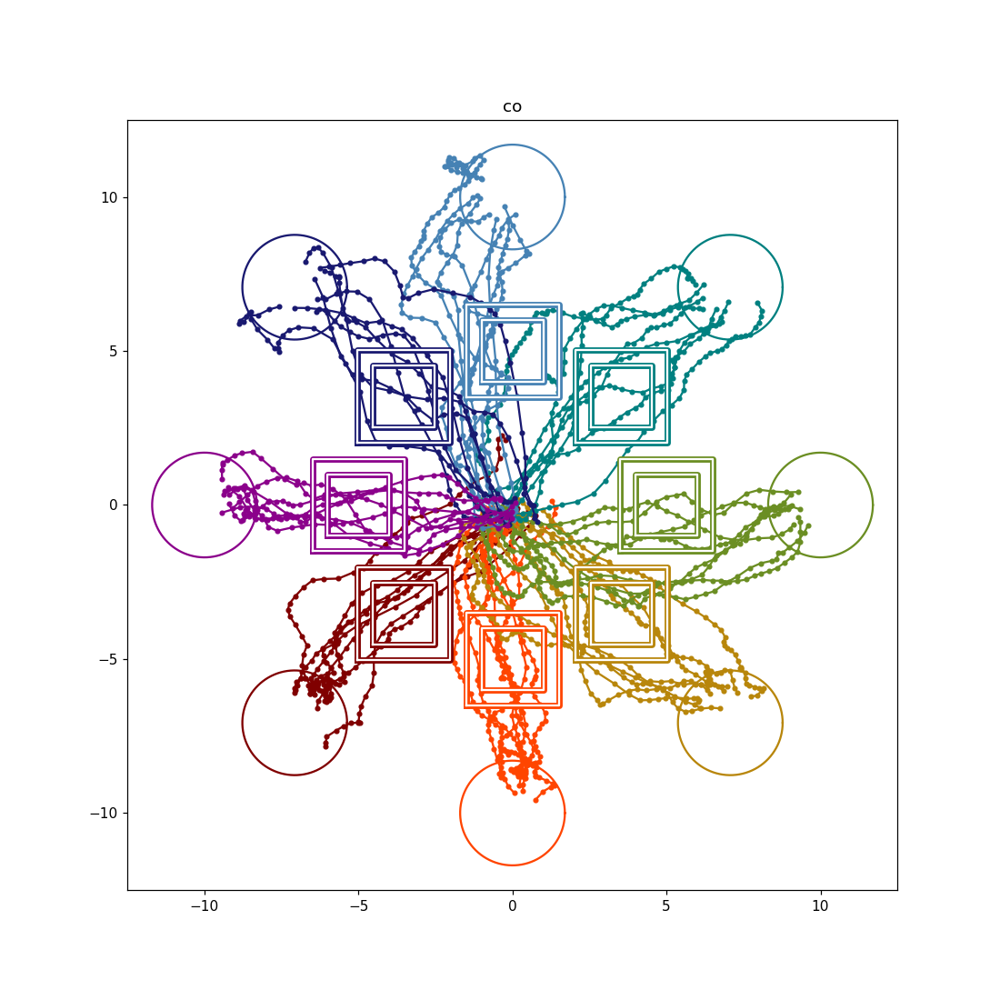

<IPython.core.display.Javascript object>


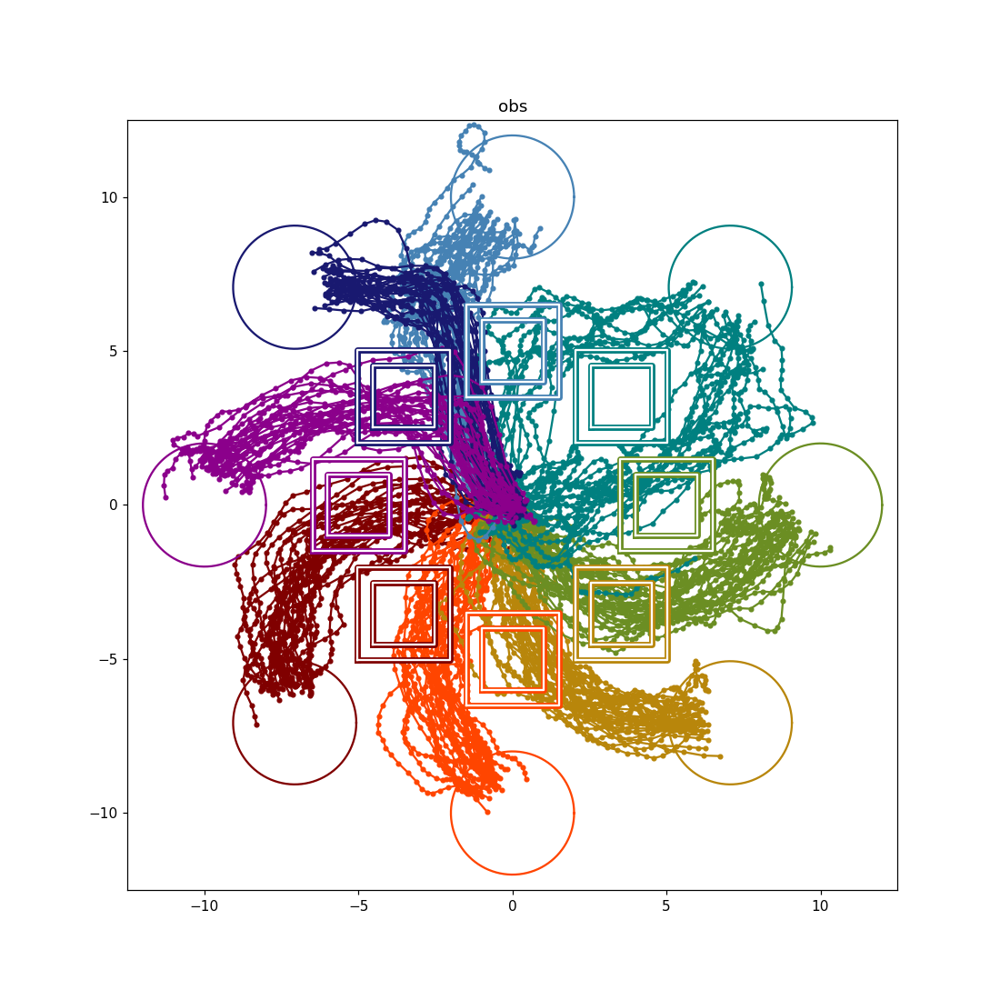

In [9]:
#PLOT ALL DATA in da_dic

plt_prefix = 'trials_p_traj'
plt_ext = ['.png']
save_bool = False

for task_str in task_list:
    task = task2idx[task_str]
    plt.figure(figsize=plot['size'])
    for target in range(num_targets):
        da = da_dic[task,target]
        x = da.loc['kin_px',:,:] #num_time X num_trials
        y = da.loc['kin_py',:,:]
        color = target_color[target]
        plt.plot(x, y, '.-', color=color)
    if plot_obs_small:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
    if plot_obs_big:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
    if plot_target: 
        bmi_util.plot_targets(target_pos, target_color, target_r_task[task]*np.ones(num_targets))  
     
    plt.axis('square')
    plt.title(task_str)
    plt.xlim(plot['xlim'])
    plt.ylim(plot['ylim'])
    plt.show()
    
    plt_name = plt_prefix + '_' + idx2task[task]
    if save_bool: 
        for ext in plt_ext:
            plt.savefig(os.path.join(save_dir, plt_name+ext))       

In [10]:
#CALCULATE PSTH:
psth_dic = {}
for task in range(num_tasks):
    for target in range(num_targets):
        mean = da_dic[task,target].mean(axis=2,skipna=True)
        N = np.logical_not(np.isnan(da_dic[task,target])).sum(axis=2) #number of data points per sample
        var = da_dic[task,target].var(axis=2,skipna=True)
        sem = (var/N)**(0.5)
        
        psth_dic[task,target,'mean'] = mean
        psth_dic[task,target,'N'] = N
        psth_dic[task,target,'var'] = var
        psth_dic[task,target,'sem'] = sem

c:\anaconda3\envs\py2\lib\site-packages\xarray\core\nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
c:\anaconda3\envs\py2\lib\site-packages\xarray\core\nputils.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwds)


<IPython.core.display.Javascript object>


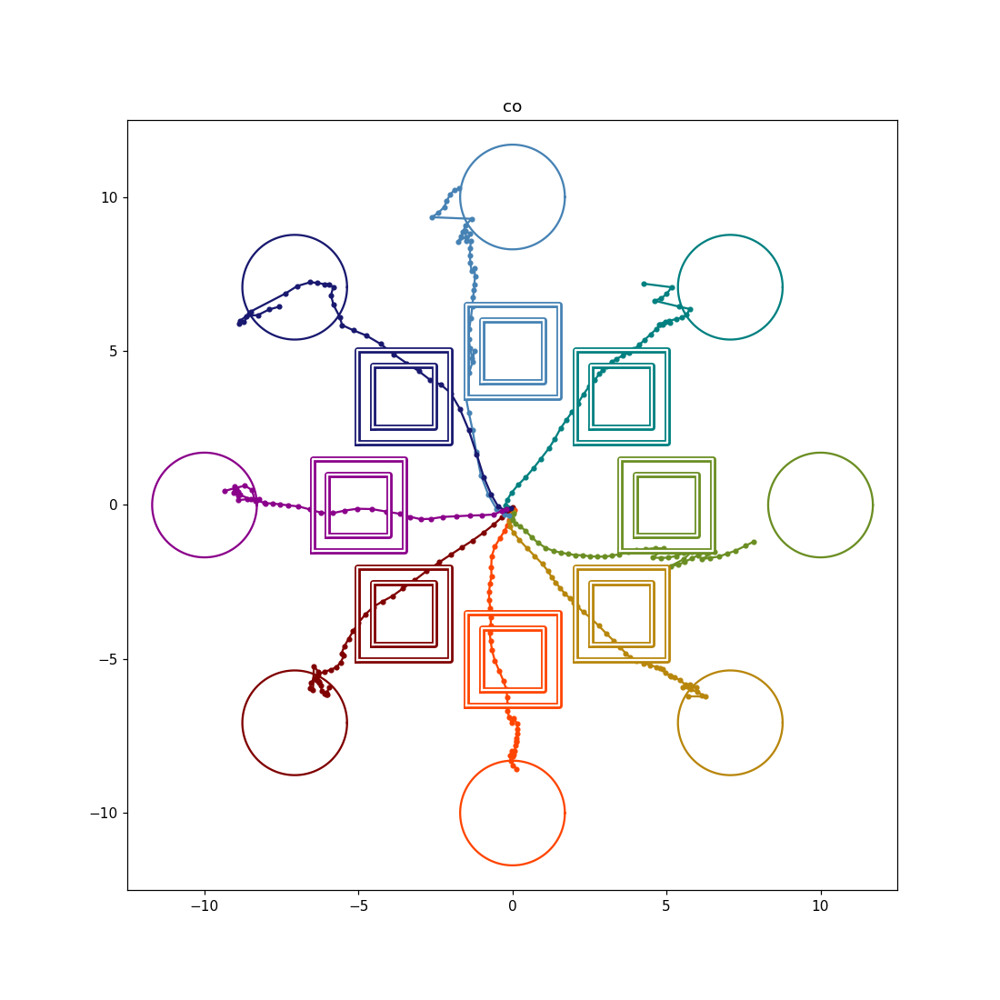

<IPython.core.display.Javascript object>


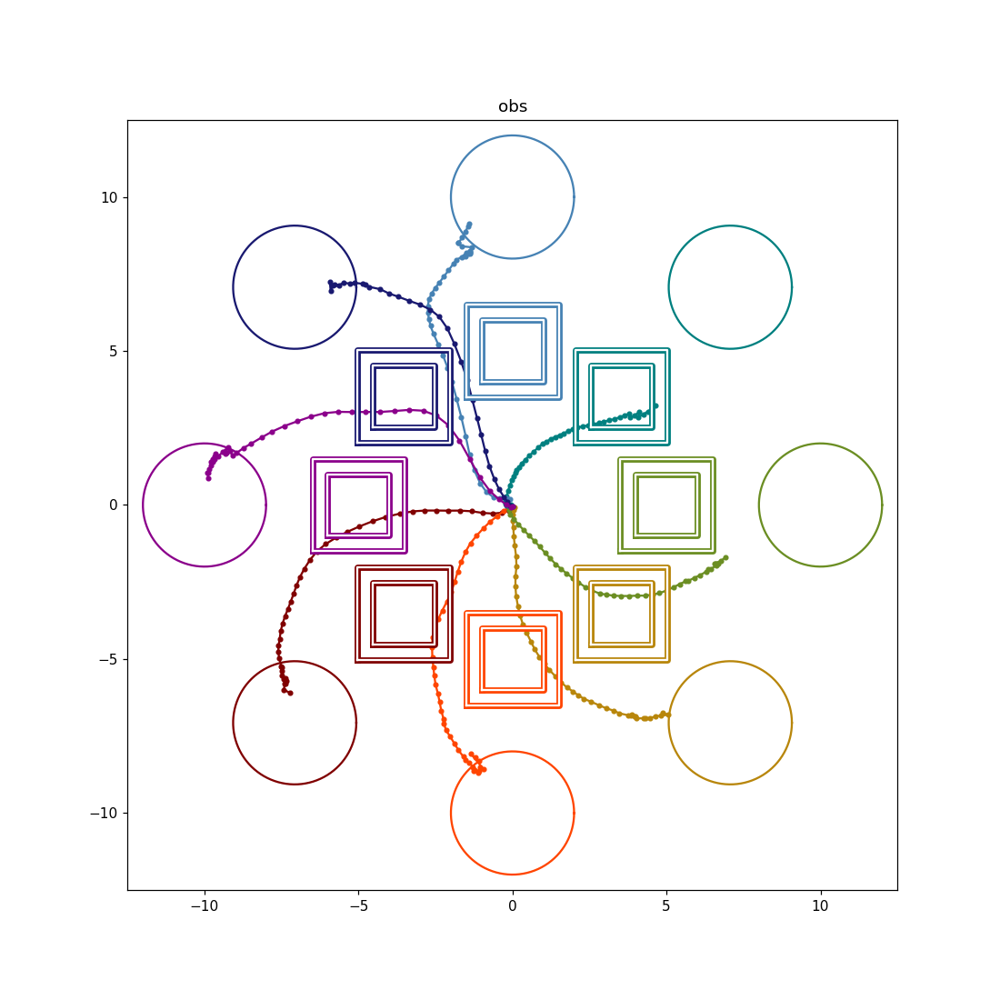

In [12]:
#PLOT PSTH
plt_prefix = 'psth_p_traj'
plt_ext = ['.png']

plt_len = 45
adapt_plt_len = False

save_bool = False
for task_str in task_list:
    task = task2idx[task_str]
    plt.figure(figsize=plot['size'])
    for target in range(num_targets):
        data = psth_dic[task,target,'mean']
        count = psth_dic[task,target,'N']
        
        if adapt_plt_len:
            plt_len = data.shape[0]
            tmp = np.where(count.loc['kin_px'] < 6)[0]
            if len(tmp) > 0:
                plt_len = tmp[0]
        
        x = data.loc['kin_px'][:plt_len] #num_time X num_trials
        y = data.loc['kin_py'][:plt_len]
        color = target_color[target]
        plt.plot(x, y, '.-', color=color)
    if plot_obs_small:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
    if plot_obs_big:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
    if plot_target: 
        bmi_util.plot_targets(target_pos, target_color, target_r_task[task]*np.ones(num_targets))  
    
    plt.axis('square')
    plt.title(task_str)
    plt.xlim(plot['xlim'])
    plt.ylim(plot['ylim'])
    plt.show()
    
    #---------------------------------------------------------------------------------------------
    if save_bool:
        plt_name = plt_prefix + '_' + idx2task[task]
        for ext in plt_ext:
            plt.savefig(os.path.join(save_dir, plt_name+ext))    

<IPython.core.display.Javascript object>


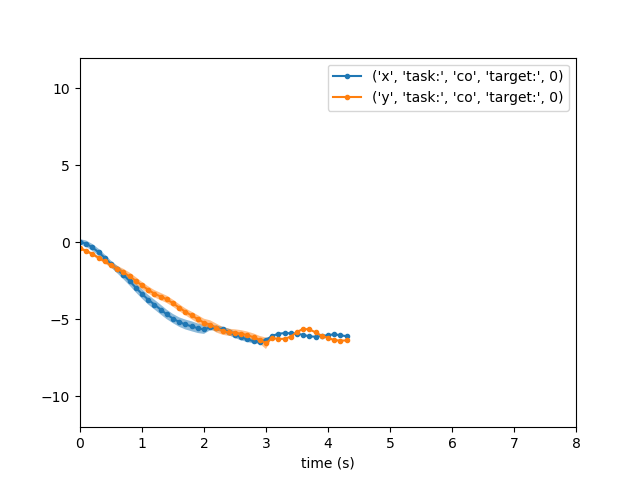

<IPython.core.display.Javascript object>


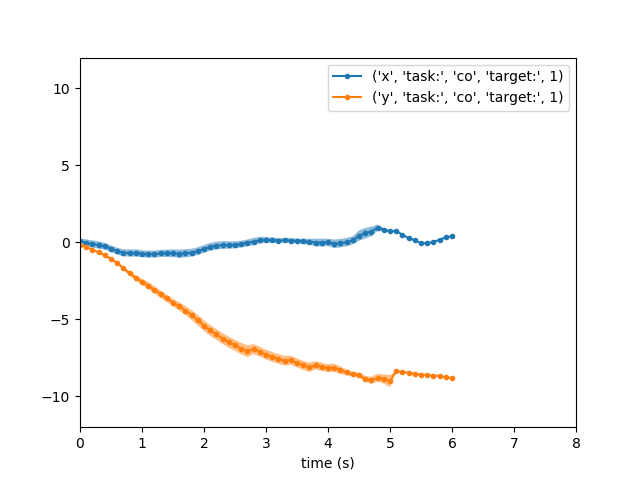

<IPython.core.display.Javascript object>


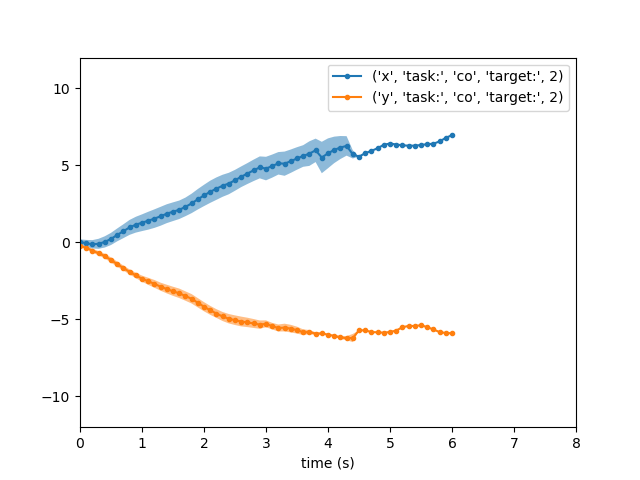

<IPython.core.display.Javascript object>


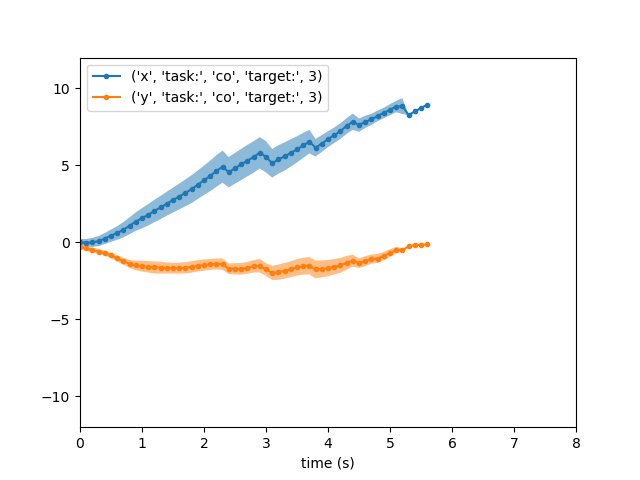

<IPython.core.display.Javascript object>


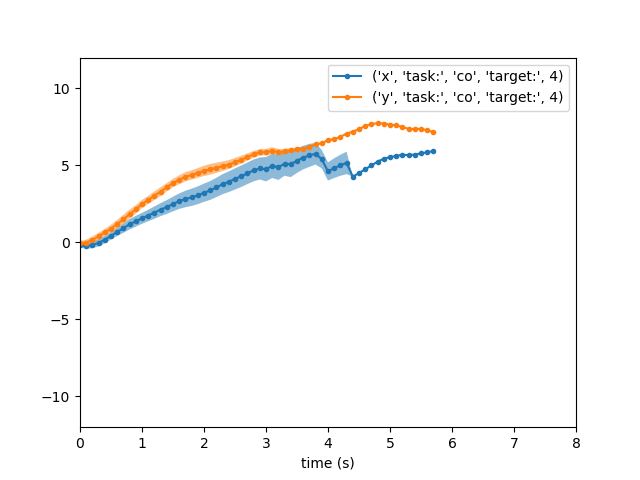

<IPython.core.display.Javascript object>


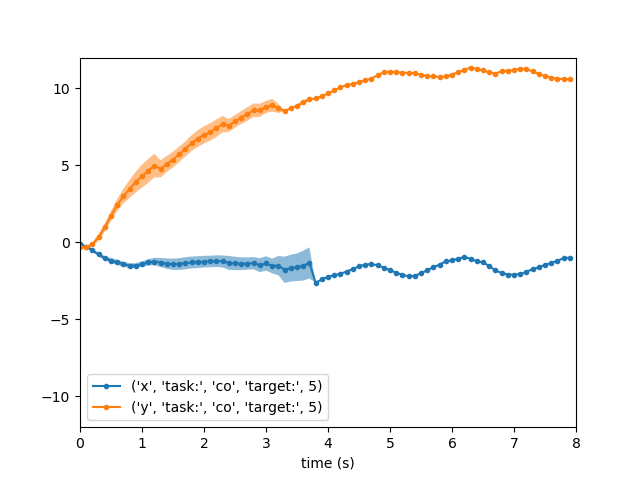

<IPython.core.display.Javascript object>


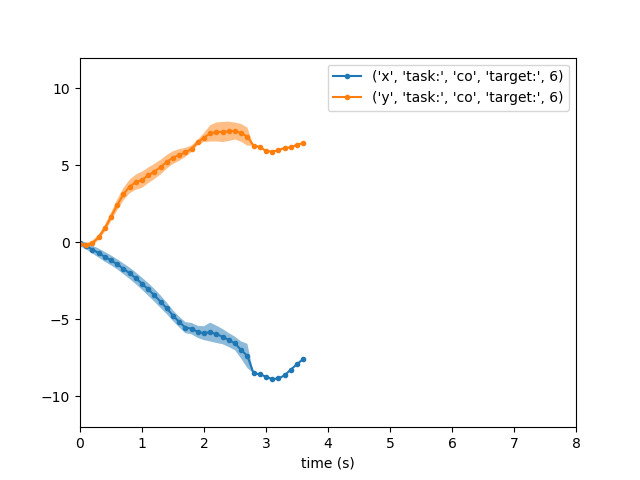

<IPython.core.display.Javascript object>


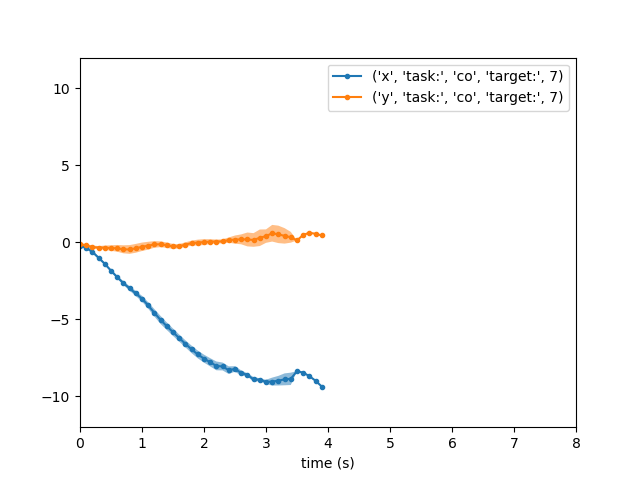

<IPython.core.display.Javascript object>


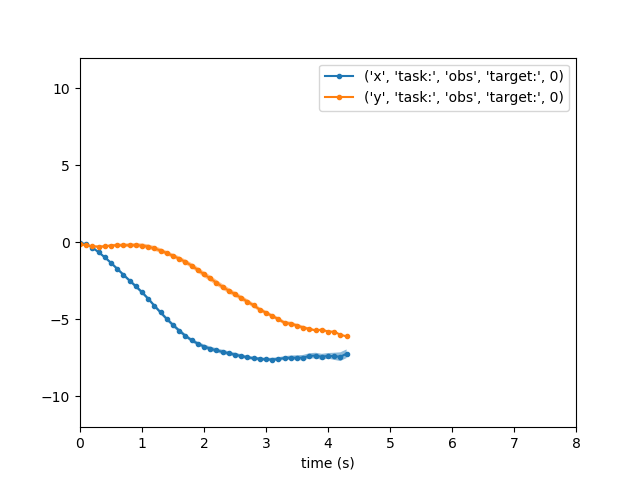

<IPython.core.display.Javascript object>


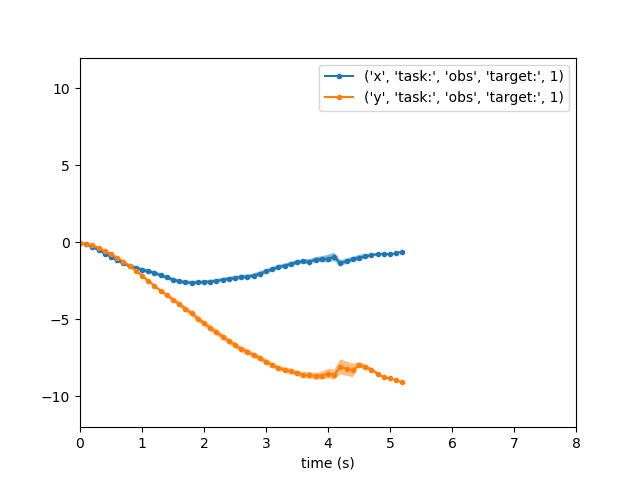

<IPython.core.display.Javascript object>


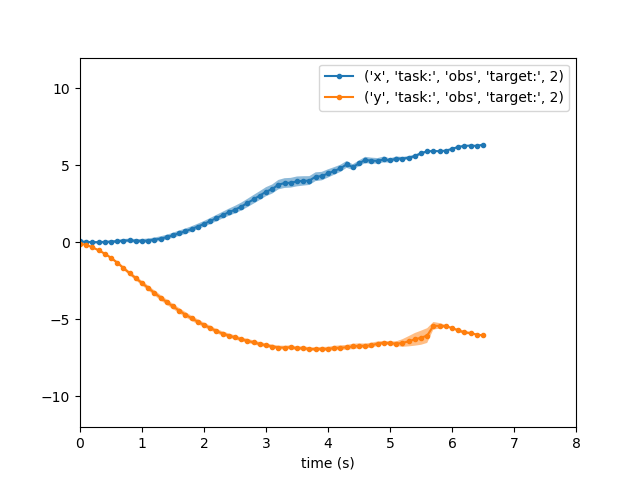

<IPython.core.display.Javascript object>


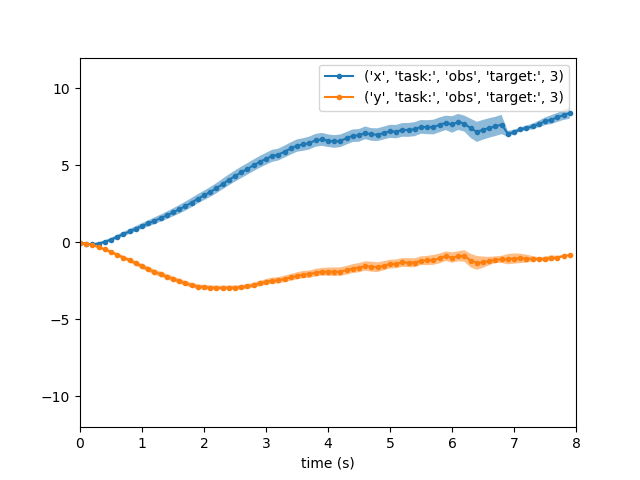

<IPython.core.display.Javascript object>


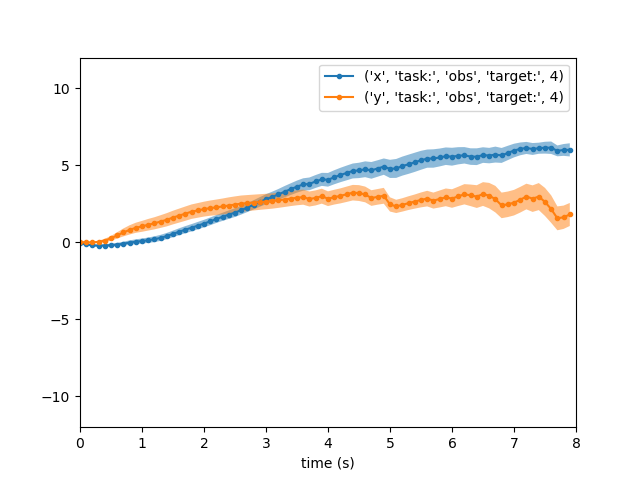

<IPython.core.display.Javascript object>


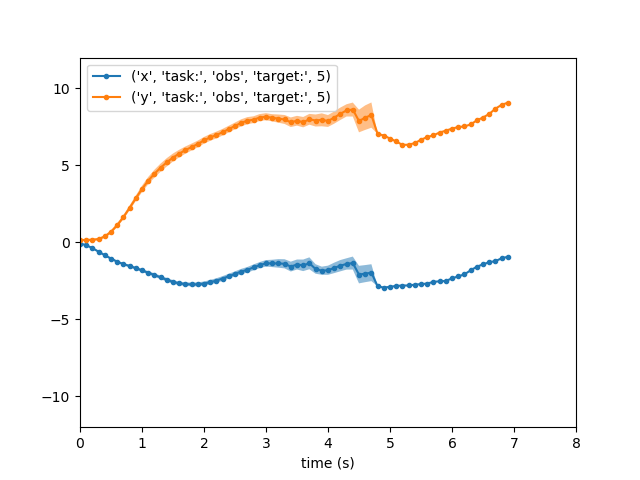

c:\anaconda3\envs\py2\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


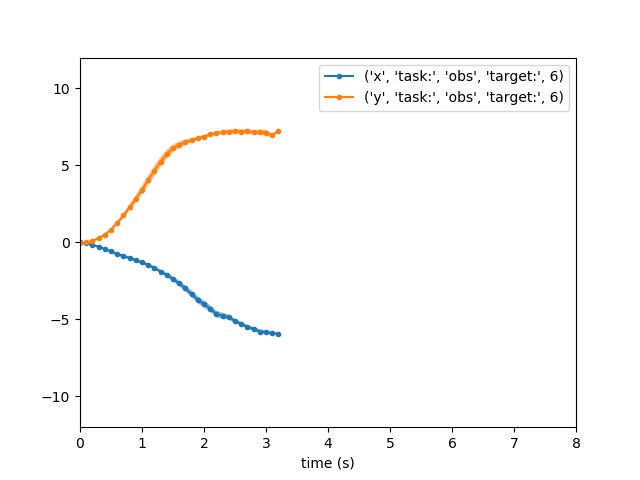

<IPython.core.display.Javascript object>


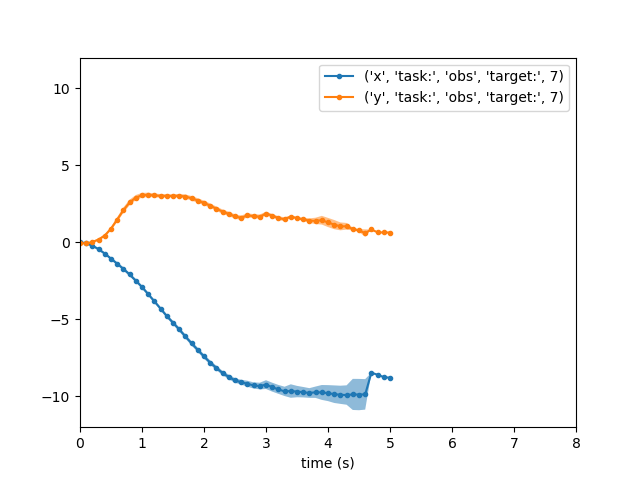

In [13]:
#Plot x,y together for each condition:
for task in range(num_tasks):
    for target in range(num_targets):
        t = psth_dic[task,target,'mean']['time']*sample_period
        
        x = psth_dic[task,target,'mean'].loc['kin_px']
        x_sem = psth_dic[task,target,'sem'].loc['kin_px']
        y = psth_dic[task,target,'mean'].loc['kin_py']
        y_sem = psth_dic[task,target,'sem'].loc['kin_py']
        
        #Plot: 
        plt.figure()
        plt.plot(t,x,'.-',label=('x','task:',idx2task[task],'target:', target)) #,color=target_color[target]
        plt.fill_between(t, x-x_sem,x+x_sem,alpha=0.5) #,color=target_color[target]
        
        plt.plot(t,y,'.-',label=('y','task:',idx2task[task],'target:', target)) #,color=target_color[target]
        plt.fill_between(t, y-y_sem,y+y_sem,alpha=0.5) #,color=target_color[target]        
        plt.legend()
        plt.xlabel('time (s)')
        plt.xlim([0, 8])
        plt.ylim([-12,12])

<IPython.core.display.Javascript object>


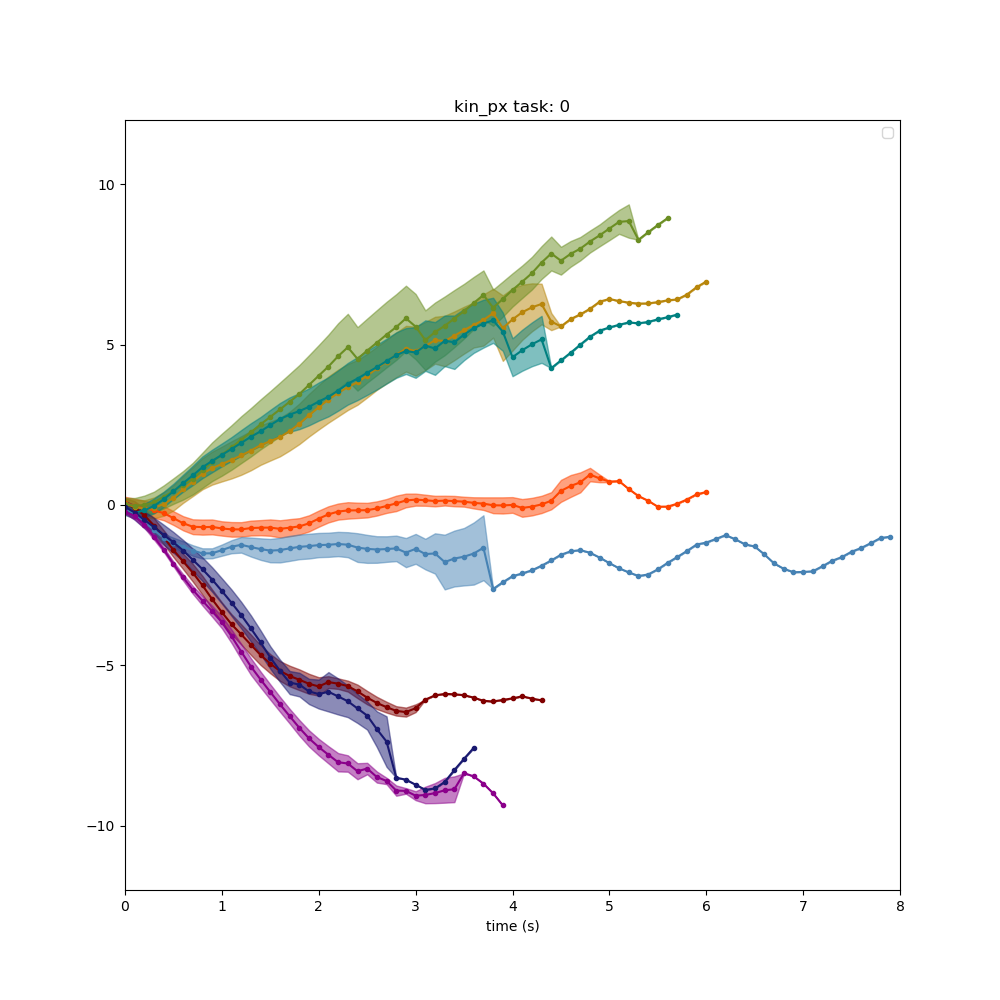

<IPython.core.display.Javascript object>


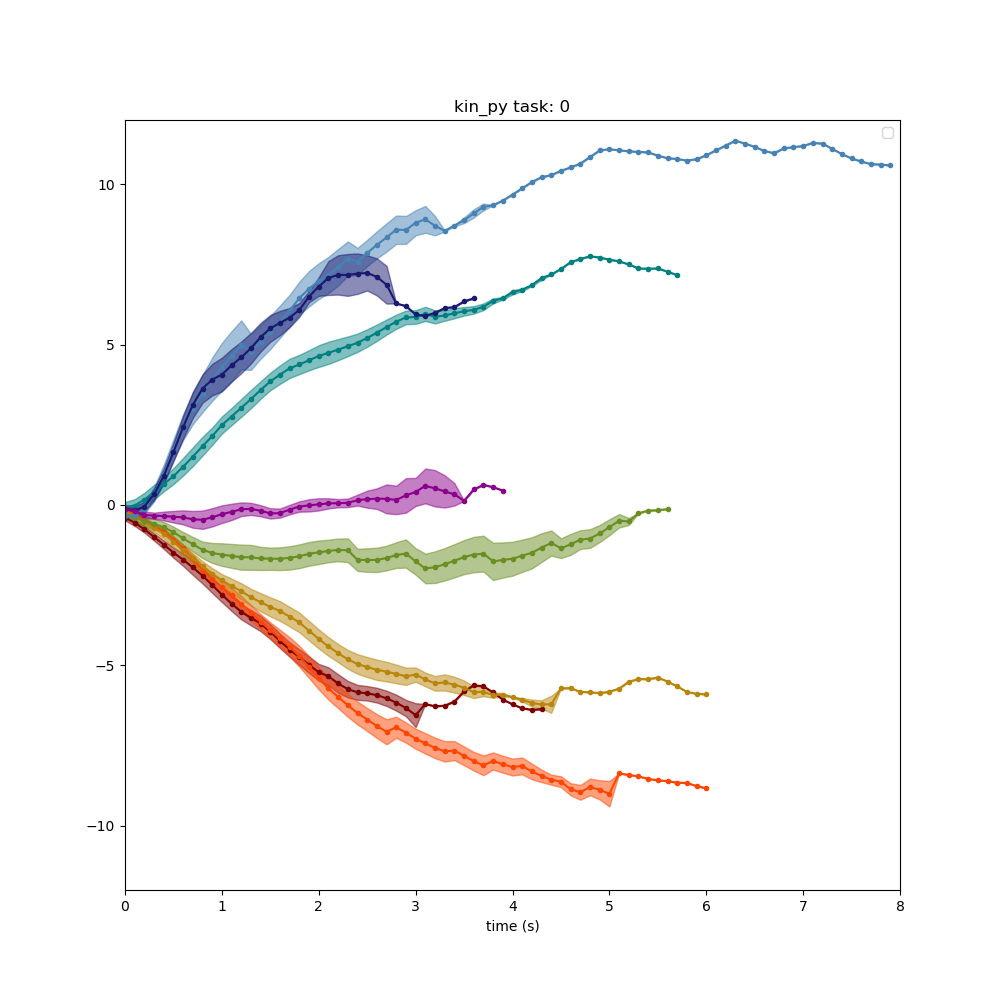

In [221]:
#Plot all conditions together:
plot_data = ['kin_px', 'kin_py']
for d in plot_data:
    for task in [0]:
        plt.figure(figsize=(10,10))
        for target in range(num_targets):
            t = psth_dic[task,target,'mean']['time']*sample_period
            x = psth_dic[task,target,'mean'].loc[d]
            x_sem = psth_dic[task,target,'sem'].loc[d]

            #Plot: 
            plt.plot(t,x,'.-', color=target_color[target])
            plt.fill_between(t, x-x_sem,x+x_sem,alpha=0.5,color=target_color[target])
        plt.legend()
        plt.title(d + ' task: ' + str(task))
        plt.xlabel('time (s)')
        plt.xlim([0, 8])
        plt.ylim([-12,12])

In [ ]:
# # Plot target position: 
# target = 0
# plt.figure()
# plt.plot([0, target_pos[target,0]], [0, target_pos[target,1]])
# plt.axis('square')
# plt.xlim([-12, 12])
# plt.ylim([-12, 12])

# target_angle = np.arctan2(target_pos[:,1], target_pos[:,0])*180/np.pi
# print(target_angle)

In [ ]:
#TODO: 
#save the polar coordinates of p,v,u in the xarray
#save another data frame for the psth
#
#

In [214]:
#Calculate magnitude and angle psth: 
angle_target_center = 1 #1 if you want it, 0 else

ctrl = {}
for task in range(num_tasks):
    for target in range(num_targets):
        d_i = da_dic[task,target]
        p = d_i.loc['kin_px':'kin_py']
        v = d_i.loc['kin_vx':'kin_vy']
        u_p = d_i.loc['u_px':'u_py']
        u_v = d_i.loc['u_vx':'u_vy']
        
        #MAG: 
        ctrl[task, target, 'p_mag'] = np.linalg.norm(p, ord=2, axis=0)
        ctrl[task, target, 'v_mag'] = np.linalg.norm(v, ord=2, axis=0)
        ctrl[task, target, 'u_p_mag'] = np.linalg.norm(u_p, ord=2, axis=0)
        ctrl[task, target, 'u_v_mag'] = np.linalg.norm(u_v, ord=2, axis=0)
        
        #ANGLE: 
        o = target_angle[target]
        ctrl[task, target, 'p_angle'] = np.arctan2(d_i.loc['kin_py'], d_i.loc['kin_px'])
        ctrl[task, target, 'v_angle'] = np.arctan2(d_i.loc['kin_vy'], d_i.loc['kin_vx'])
        ctrl[task, target, 'u_p_angle'] = np.arctan2(d_i.loc['u_py'], d_i.loc['u_px'])
        ctrl[task, target, 'u_v_angle'] = np.arctan2(d_i.loc['u_vy'], d_i.loc['u_vx'])
        
        ctrl[task, target, 'p_angle_ctr'] = bmi_b.center_angle(ctrl[task, target, 'p_angle'],0, o)
        ctrl[task, target, 'v_angle_ctr'] = bmi_b.center_angle(ctrl[task, target, 'v_angle'],0, o)
        ctrl[task, target, 'u_p_angle_ctr'] = bmi_b.center_angle(ctrl[task, target, 'u_p_angle'],0, o)
        ctrl[task, target, 'u_v_angle_ctr'] = bmi_b.center_angle(ctrl[task, target, 'u_v_angle'],0, o)
        
ctrl_list = ['p_mag', 'p_angle', 'p_angle_ctr',
             'v_mag', 'v_angle', 'v_angle_ctr',
             'u_v_mag', 'u_v_angle', 'u_v_angle_ctr',
             'u_p_mag', 'u_p_angle', 'u_p_angle_ctr']
ctrl_psth = {}
for task in range(num_tasks):
    for target in range(num_targets):
        for d in ctrl_list:
#             print(d)
            data = ctrl[task, target, d]
            data = np.ma.array(data,mask=np.isnan(data))
            mean = data.mean(axis=1)
            N = np.logical_not(np.isnan(data)).sum(axis=1)
            var = data.var(axis=1)
            sem = (var/N)**(0.5)
            
            ctrl_psth[task,target, d, 'mean'] = mean
            ctrl_psth[task,target, d, 'N'] = N
            ctrl_psth[task,target, d, 'var'] = var
            ctrl_psth[task,target, d, 'sem'] = sem
            

<IPython.core.display.Javascript object>


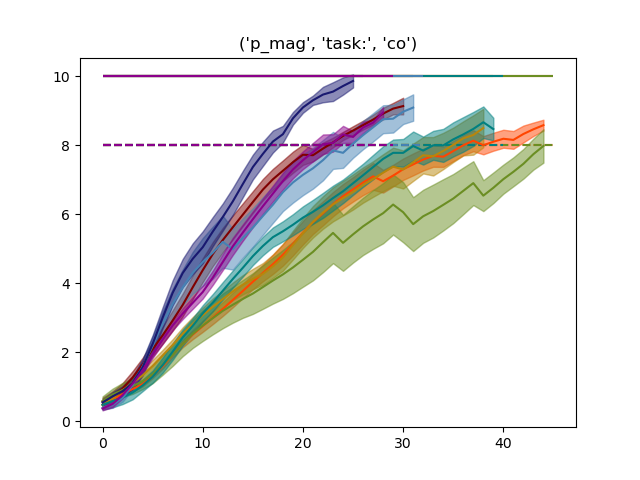

<IPython.core.display.Javascript object>


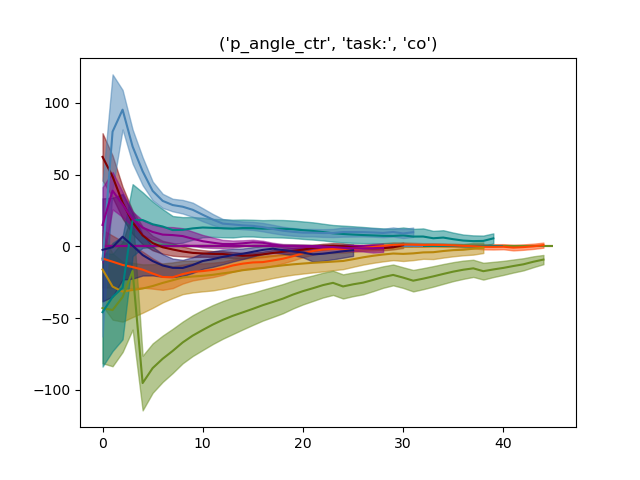

<IPython.core.display.Javascript object>


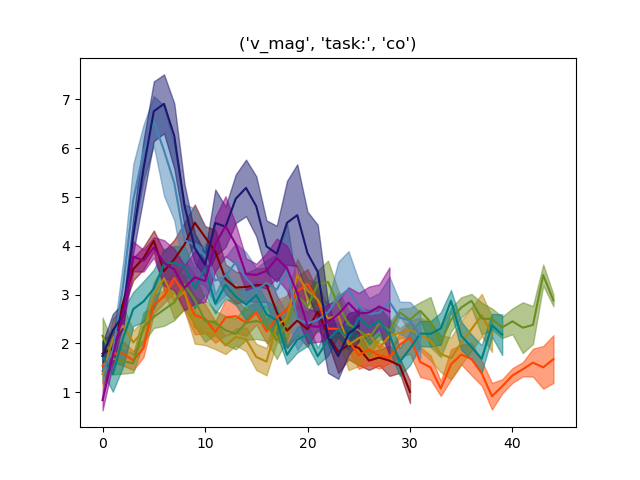

<IPython.core.display.Javascript object>


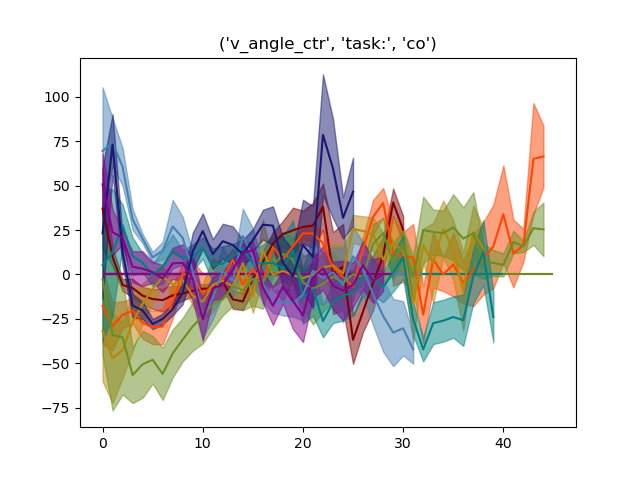

<IPython.core.display.Javascript object>


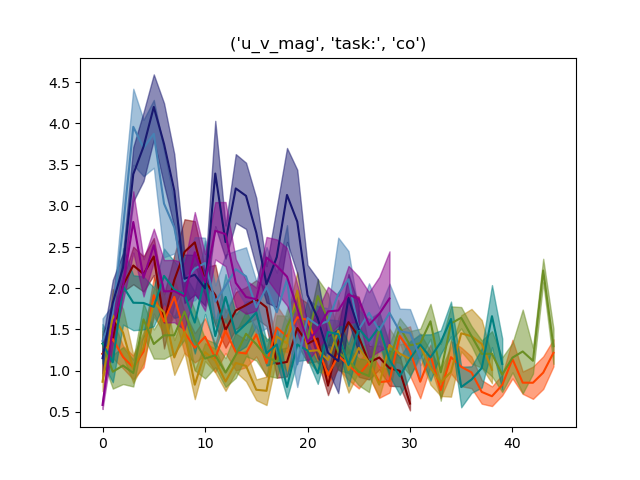

<IPython.core.display.Javascript object>


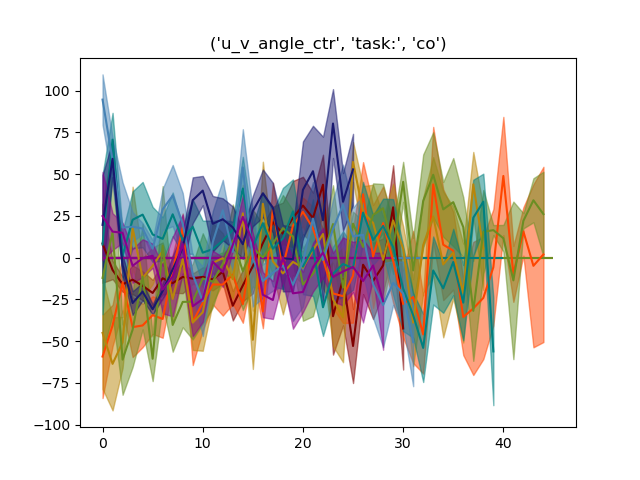

<IPython.core.display.Javascript object>


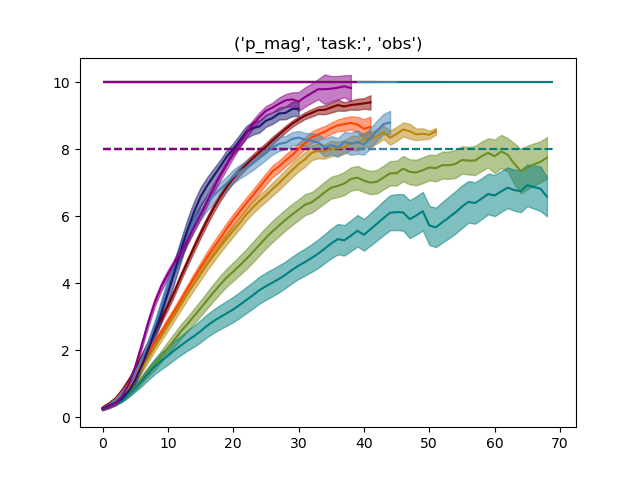

<IPython.core.display.Javascript object>


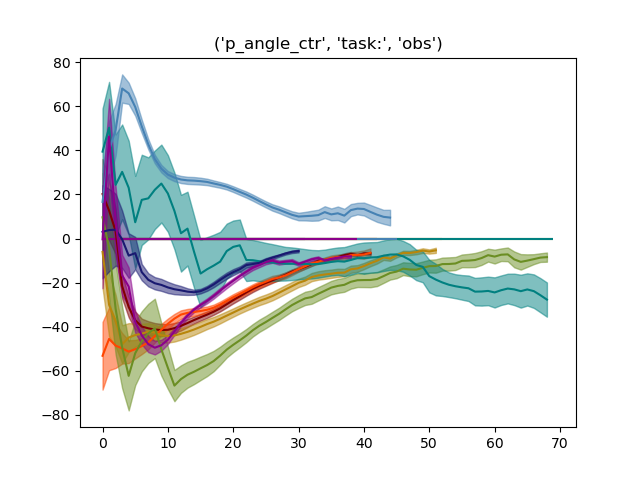

<IPython.core.display.Javascript object>


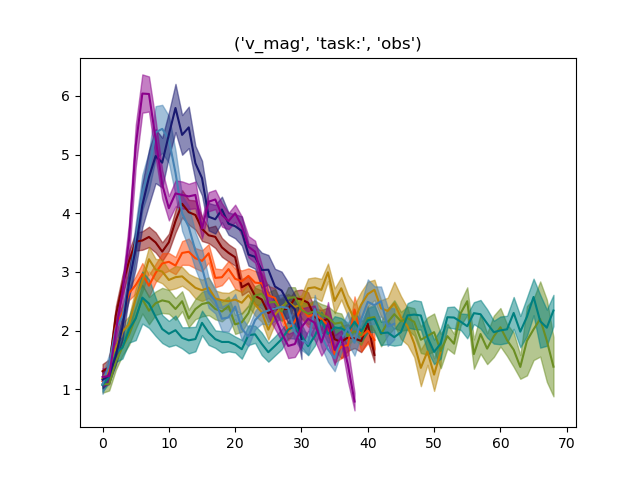

<IPython.core.display.Javascript object>


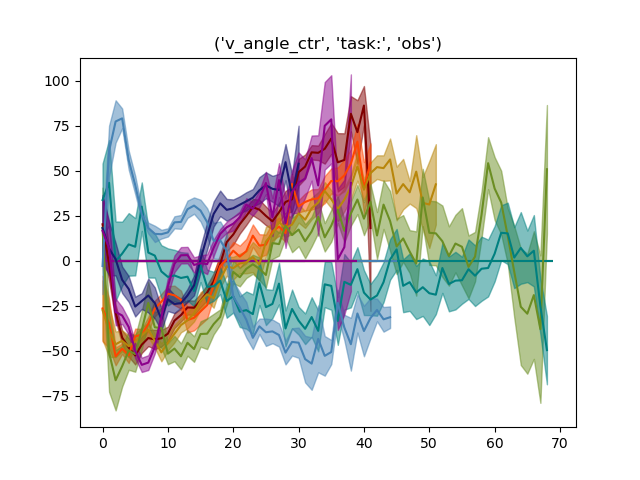

<IPython.core.display.Javascript object>


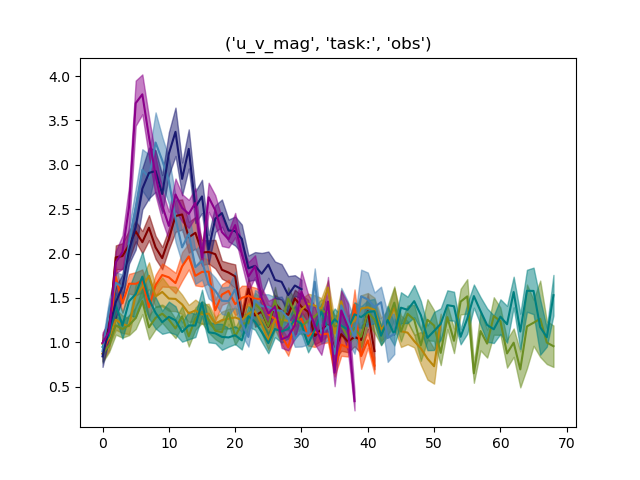

<IPython.core.display.Javascript object>


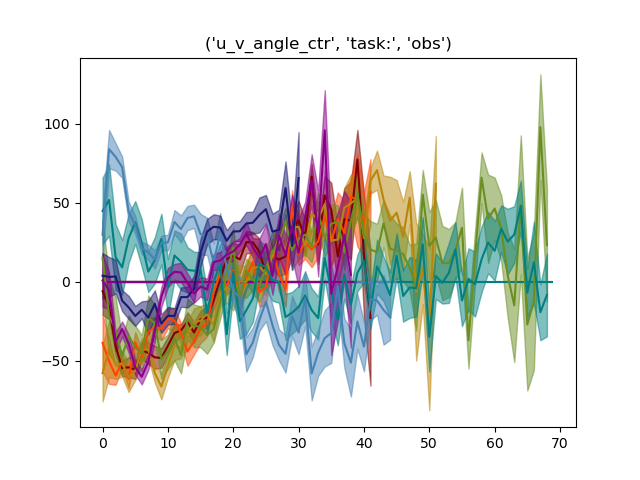

In [215]:
#ALL TARGETS TOGETHER, task separate
ctrl_list = ['p_mag', 'p_angle_ctr', 'v_mag', 'v_angle_ctr', 'u_v_mag', 'u_v_angle_ctr'] #'u_p_mag', 'u_p_angle',
task = 0
# target = 0
plot_trials =False
N_min = 3
plt_len=80

save_bool = False
plt_prefix = 'psth'
plt_ext = ['.png', '.eps']

for task in [0,1]:
    for d in ctrl_list: 
        plt.figure()
        for target in range(num_targets):
            len_check = np.where(ctrl_psth[task,target,d,'N']<=N_min)[0]
            if len(len_check)>0:
                plt_len = len_check[0]

            y = ctrl[task,target,d][:plt_len,:]            
            y_mean = ctrl_psth[task,target,d,'mean'][:plt_len]
            y_sem = ctrl_psth[task,target,d,'sem'][:plt_len]    
                
            if 'angle_ctr' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(0,0,plt_len,color=target_color[target])                
            elif 'angle_' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(target_angle[target]*180/np.pi,0,plt_len,color=target_color[target])
            elif d == 'p_mag':
                plt.hlines(target_dist[target],0,plt_len,color=target_color[target])
                plt.hlines(target_dist[target]-target_r,0,plt_len, linestyles='--', color=target_color[target])
                           
            if plot_trials:
                r = plt.plot(y, color='k')
            plt.plot(y_mean, color=target_color[target])
            plt.fill_between(range(len(y)), y_mean-y_sem,y_mean+y_sem,alpha=0.5,color=target_color[target])
        plt.title((d, 'task:', idx2task[task]))
        
        if save_bool: 
            plt_name = plt_prefix + '_' + idx2task[task] + '_' + d
            for ext in plt_ext:
                plt.savefig(os.path.join(save_dir, plt_name+ext))
        

<IPython.core.display.Javascript object>


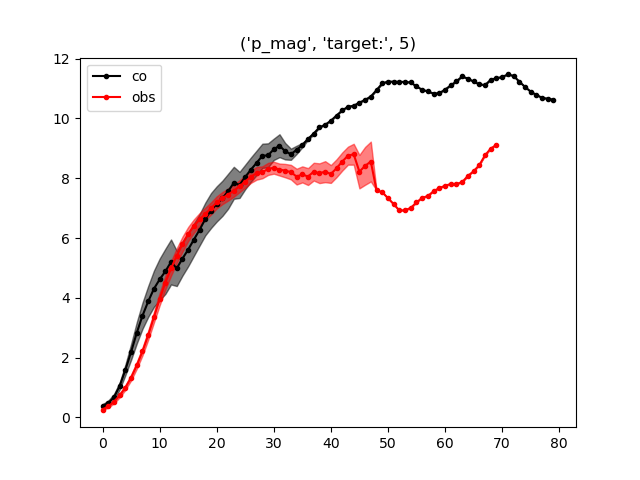

<IPython.core.display.Javascript object>


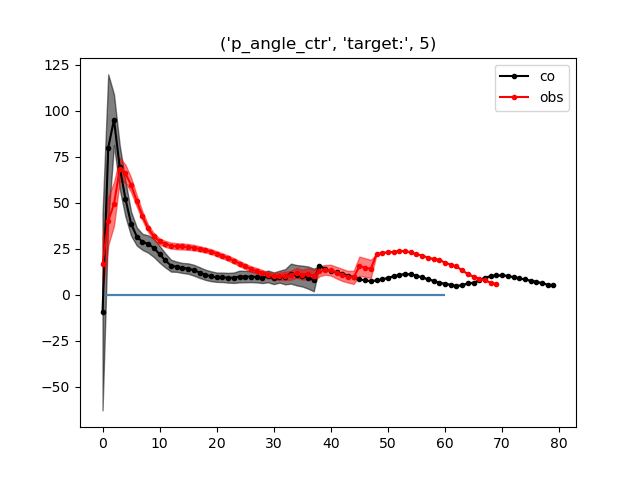

<IPython.core.display.Javascript object>


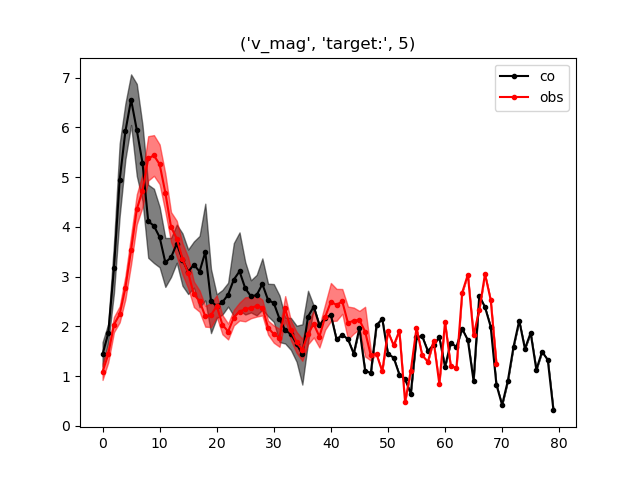

<IPython.core.display.Javascript object>


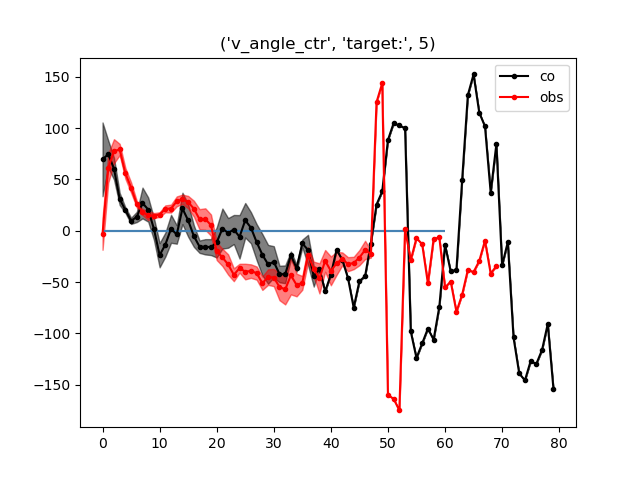

<IPython.core.display.Javascript object>


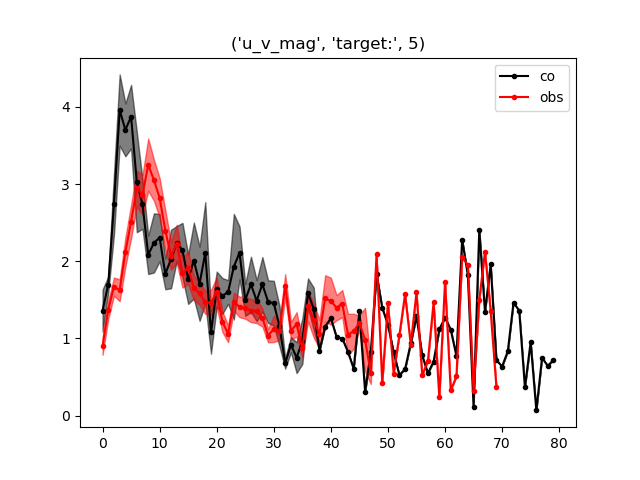

<IPython.core.display.Javascript object>


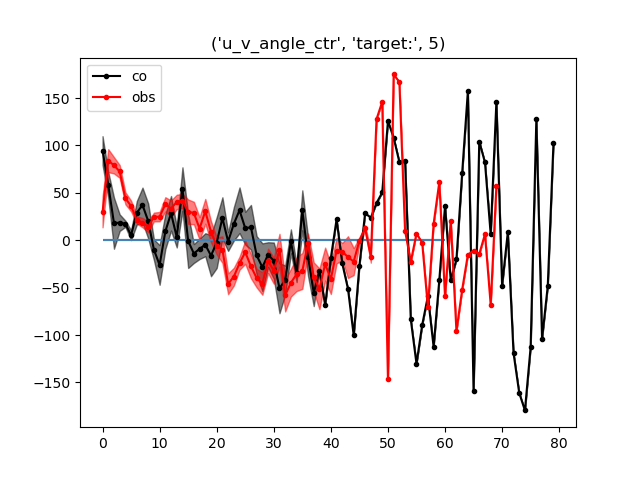

In [216]:
#TASK together
ctrl_list = ['p_mag', 'p_angle_ctr', 'v_mag', 'v_angle_ctr', 'u_v_mag', 'u_v_angle_ctr'] #'u_p_mag', 'u_p_angle',
# ['p_angle']#
task = 0
# target = 0
plot_trials =False

task_color = ['k', 'r']

for target in [5]: #range(num_targets):
    for d in ctrl_list: 
        plt.figure()
        for task in [0,1]:
            y = ctrl[task,target,d]
            y_mean = ctrl_psth[task,target,d,'mean']
            y_sem = ctrl_psth[task,target,d,'sem']    
            if 'angle_ctr' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(0,0,60,color=target_color[target])
#                 plt.hlines(target_angle[target]*180/np.pi,0,60,color=target_color[target])
            if plot_trials:
                r = plt.plot(y, '.-', color='k')

            plt.plot(y_mean, '.-', color=task_color[task], label=idx2task[task])
            plt.fill_between(range(len(y)), y_mean-y_sem,y_mean+y_sem,alpha=0.5,color=task_color[task])
        plt.legend()
        plt.title((d, 'target:', target))


In [ ]:
#ALL CONDITIONS SEPARATE
ctrl_list = ['p_mag', 'p_angle', 'v_mag', 'v_angle', 'u_v_mag', 'u_v_angle'] #'u_p_mag', 'u_p_angle',
task = 0
# target = 0
plot_trials =False
for task in [0,1]:
    for target in range(num_targets):
        for d in ctrl_list: 
            y = ctrl[task,target,d]
            y_mean = ctrl_psth[task,target,d,'mean']
            y_sem = ctrl_psth[task,target,d,'sem']    
            plt.figure()
            if 'angle' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 

                plt.hlines(target_angle[target]*180/np.pi,0,40,color=target_color[target])
                plt.legend()

            if plot_trials:
                r = plt.plot(y, color='k')


            plt.plot(y_mean, color=target_color[target])
            plt.fill_between(range(len(y)), y_mean-y_sem,y_mean+y_sem,alpha=0.5,color=target_color[target])
            plt.title((d, 'task:', task))


### Average over targets and compare task: 

In [219]:
# Average mag, abs angle
d_list = ['p_mag', 'p_angle_ctr', 'v_mag', 'v_angle_ctr', 'u_v_mag', 'u_v_angle_ctr']
for task in range(num_tasks):
    for d in d_list:
        d_mat = np.zeros((num_targets, num_time))
        d_mat = np.ma.array(d_mat)
        for target in range(num_targets):
            mean = ctrl_psth[task,target,d,'mean']
            if 'angle' in d: 
                if np.sum(mean[:10]) > 0:
                    mean = -mean
                #want the absolute angle                
            d_mat[target,:] = mean
        #PSTH:         
#         mean = d_mat.mean(axis=0)
#         N = np.logical_not(np.isnan(d_mat)).sum(axis=0)
#         var = data.var(axis=1)
#         sem = (var/N)**(0.5)        
        ctrl_psth[task,d,'mat'] = d_mat
        ctrl_psth[task,d,'mean'] = d_mat.mean(axis=0)
        ctrl_psth[task,d,'var'] = d_mat.var(axis=0)
        ctrl_psth[task,d,'sem'] = sio_stat.sem(d_mat, axis=0, nan_policy='omit')

        

<IPython.core.display.Javascript object>


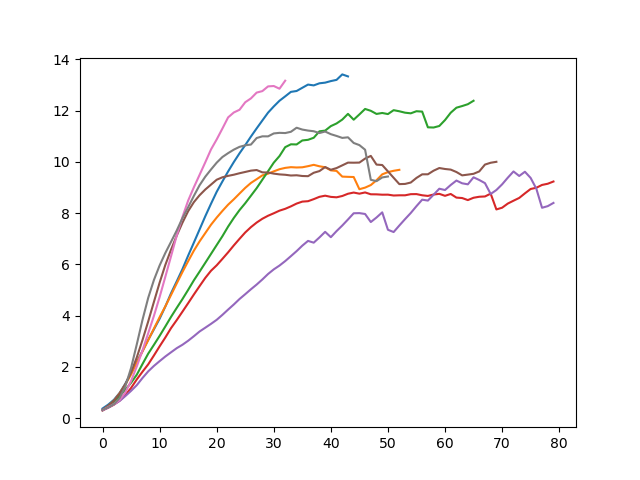

In [17]:
plt.figure()
r=plt.plot(ctrl_psth[task,'p_mag','mat'].T)

<IPython.core.display.Javascript object>


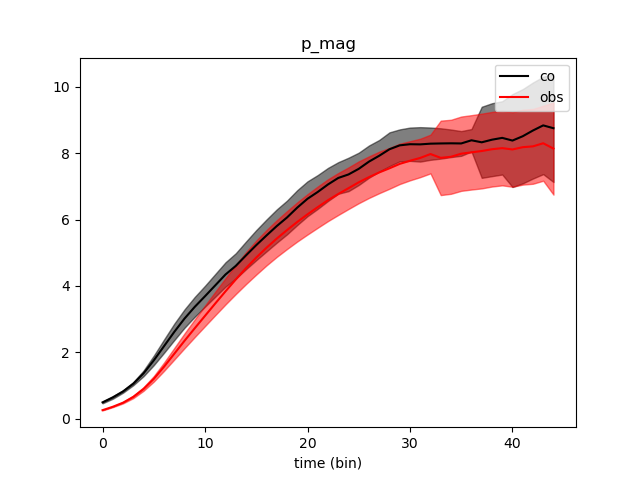

<IPython.core.display.Javascript object>


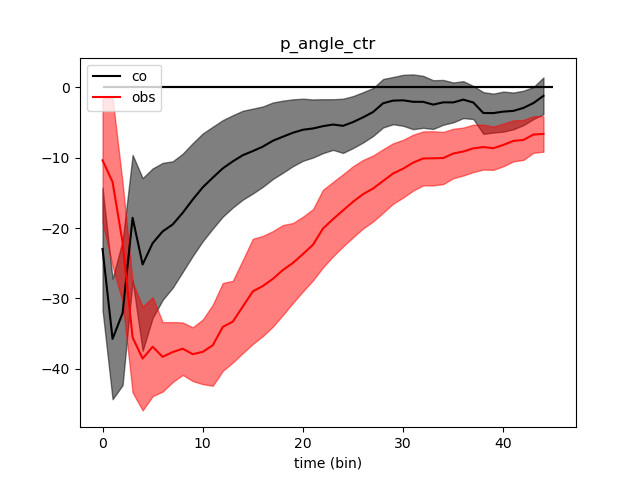

<IPython.core.display.Javascript object>


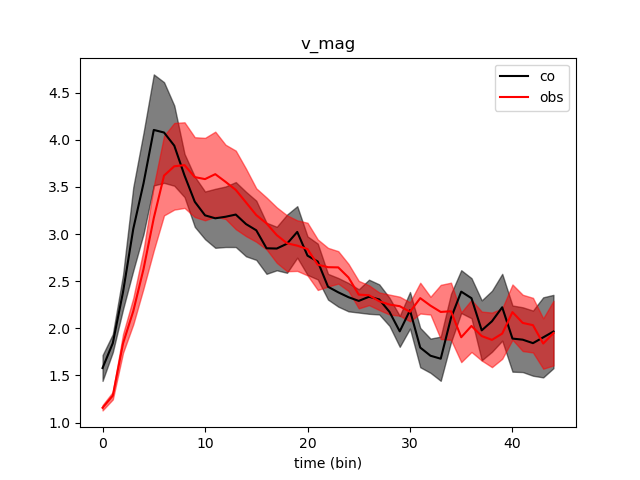

<IPython.core.display.Javascript object>


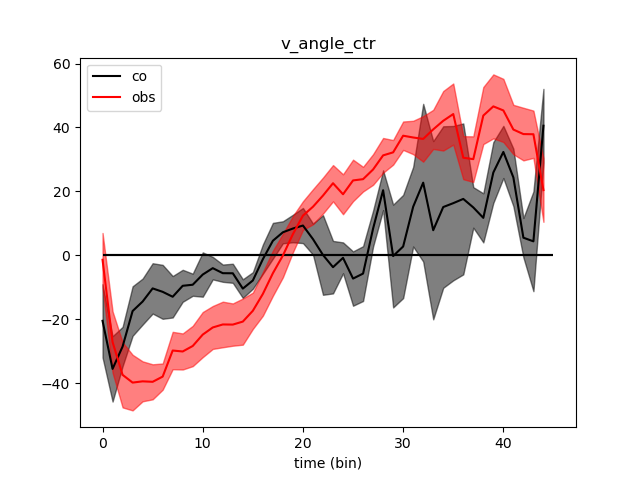

<IPython.core.display.Javascript object>


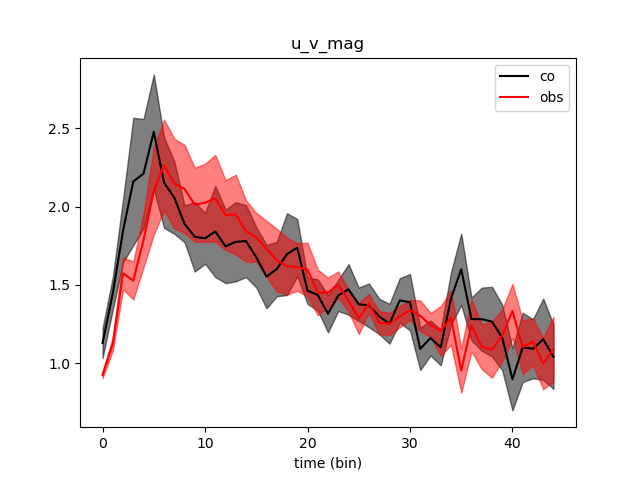

<IPython.core.display.Javascript object>


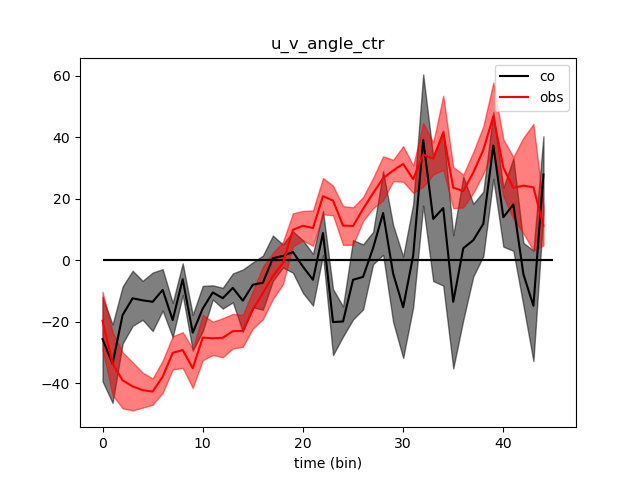

In [220]:
save_bool = False
plt_prefix = 'task_psth'
plt_ext = ['.png']

plot_len = 45
for d in d_list:
    plt.figure()
    for task in range(num_tasks):
        y_mean = ctrl_psth[task,d,'mean'][:plot_len]
        y_sem = ctrl_psth[task,d,'sem'][:plot_len]
        if 'angle' in d:
            y = y*180/np.pi
            y_mean = y_mean*180/np.pi
            y_sem = y_sem*180/np.pi 
            plt.hlines(0,0,plot_len,color='k')
            plt.legend()
        plt.plot(y_mean, color=task_color[task],label=idx2task[task])
        plt.fill_between(range(len(y_mean)), y_mean-y_sem,y_mean+y_sem,alpha=0.5,color=task_color[task])
    plt.xlabel('time (bin)')
    plt.title(d)
    plt.legend()
        
    if save_bool: 
        plt_name = plt_prefix + '_' + d
        for ext in plt_ext:
            plt.savefig(os.path.join(save_dir, plt_name+ext))

In [ ]:
#PLOT PSTH
plt_prefix = 'psth_p_traj'
plt_ext = ['.png']

plt_len = 45
adapt_plt_len = False

save_bool = False
for task_str in task_list:
    task = task2idx[task_str]
    plt.figure(figsize=plot['size'])
    for target in range(num_targets):
        data = psth_dic[task,target,'mean']
        count = psth_dic[task,target,'N']
        
        if adapt_plt_len:
            plt_len = data.shape[0]
            tmp = np.where(count.loc['kin_px'] < 6)[0]
            if len(tmp) > 0:
                plt_len = tmp[0]
        
        x = data.loc['kin_px'][:plt_len] #num_time X num_trials
        y = data.loc['kin_py'][:plt_len]
        color = target_color[target]
        plt.plot(x, y, '.-', color=color)
    if plot_obs_small:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
    if plot_obs_big:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
    if plot_target: 
        bmi_util.plot_targets(target_pos, target_color, target_r*np.ones(num_targets))  
    
    plt.axis('square')
    plt.title(task_str)
    plt.xlim(plot['xlim'])
    plt.ylim(plot['ylim'])
    plt.show()
    
    #---------------------------------------------------------------------------------------------
    if save_bool:
        plt_name = plt_prefix + '_' + idx2task[task]
        for ext in plt_ext:
            plt.savefig(os.path.join(save_dir, plt_name+ext))    

c:\anaconda3\envs\py2\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


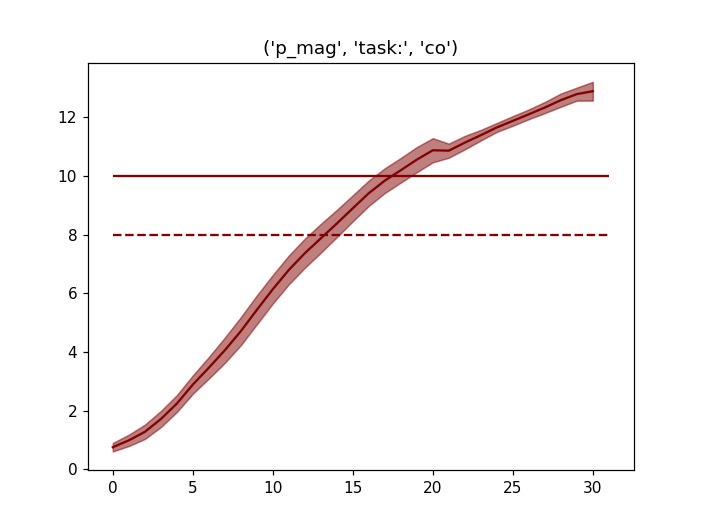

<IPython.core.display.Javascript object>


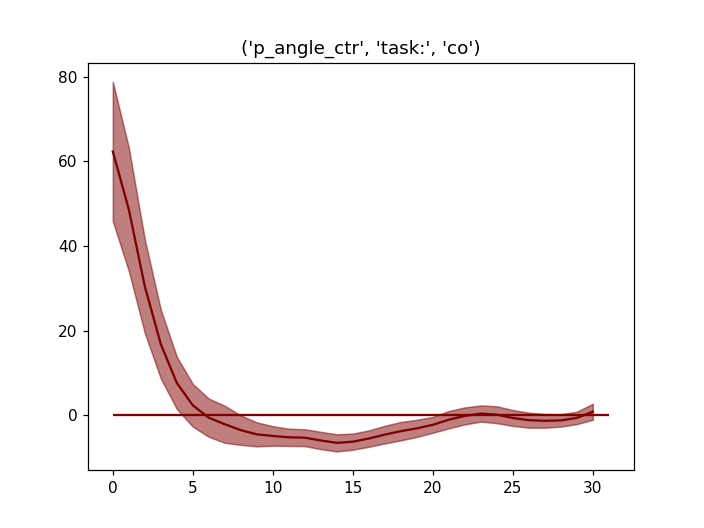

<IPython.core.display.Javascript object>


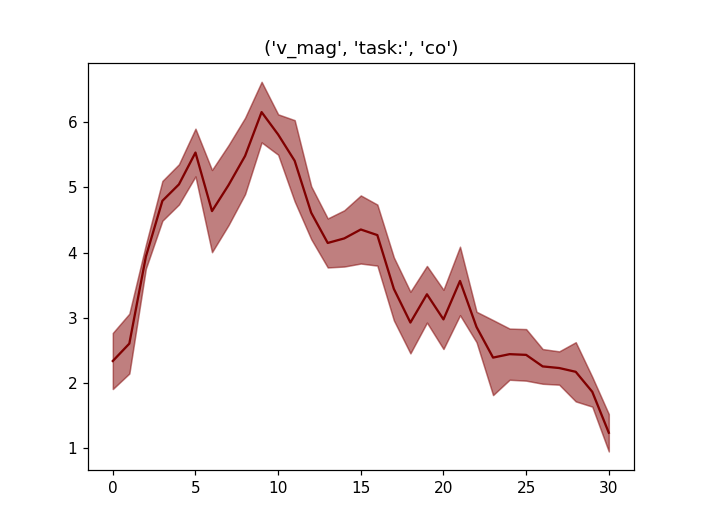

<IPython.core.display.Javascript object>


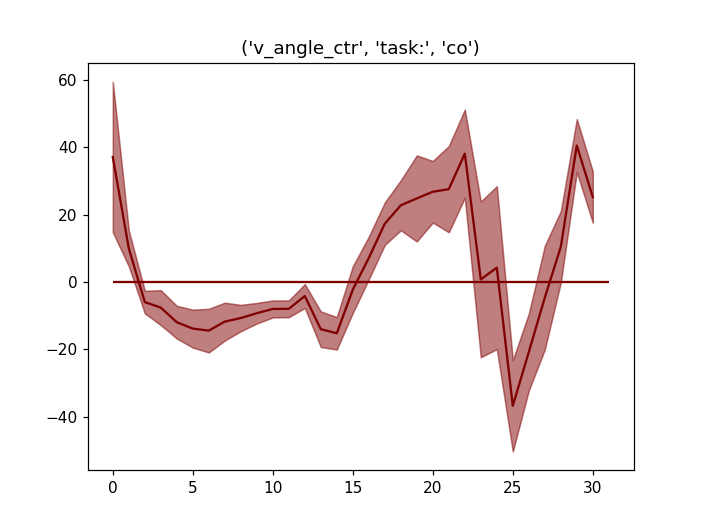

<IPython.core.display.Javascript object>


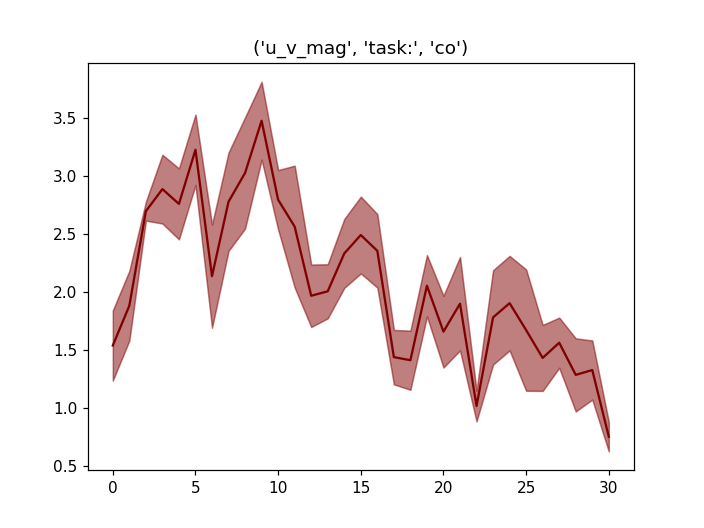

<IPython.core.display.Javascript object>


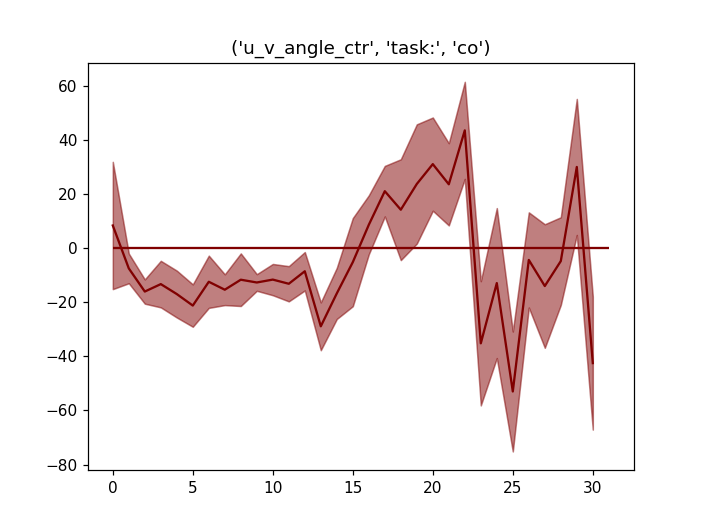

<IPython.core.display.Javascript object>


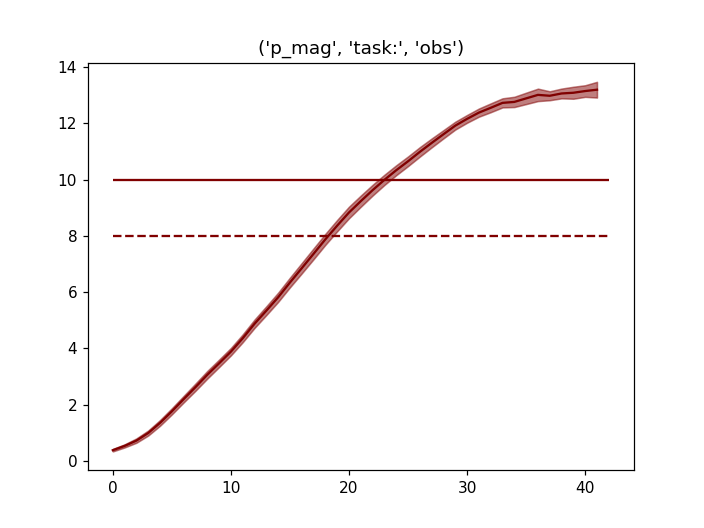

<IPython.core.display.Javascript object>


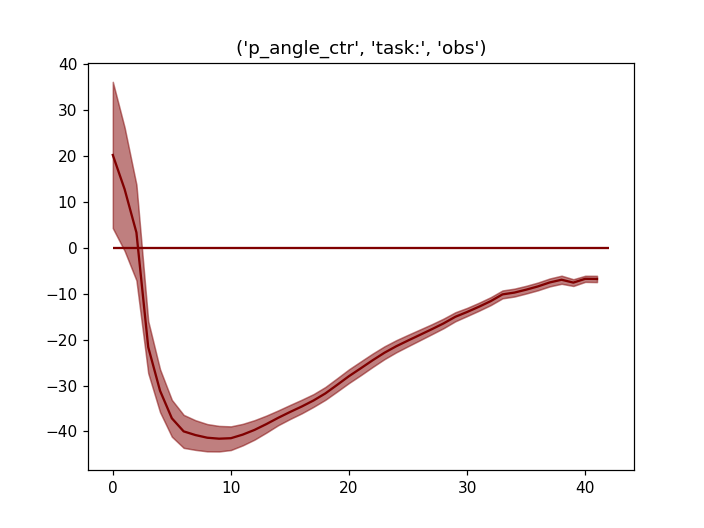

<IPython.core.display.Javascript object>


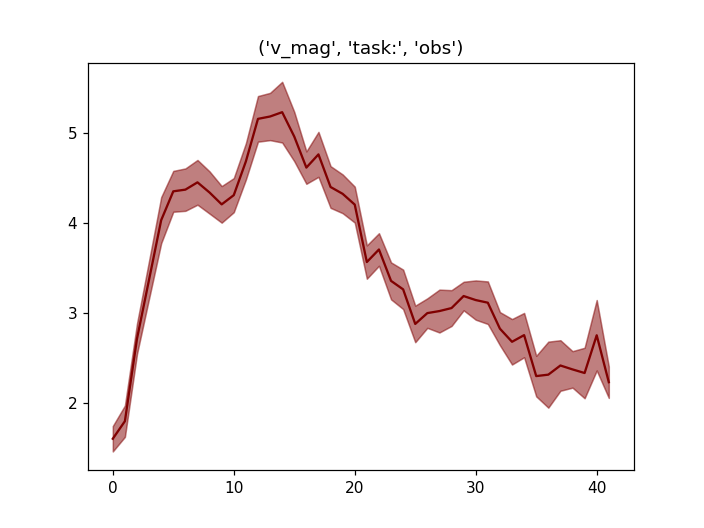

<IPython.core.display.Javascript object>


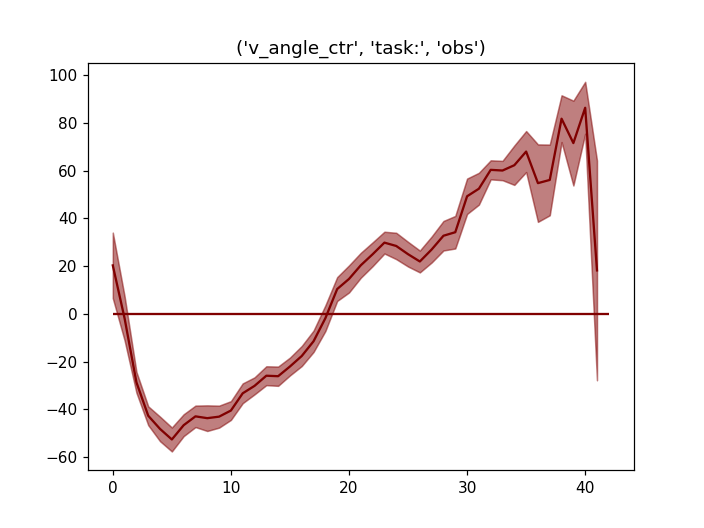

<IPython.core.display.Javascript object>


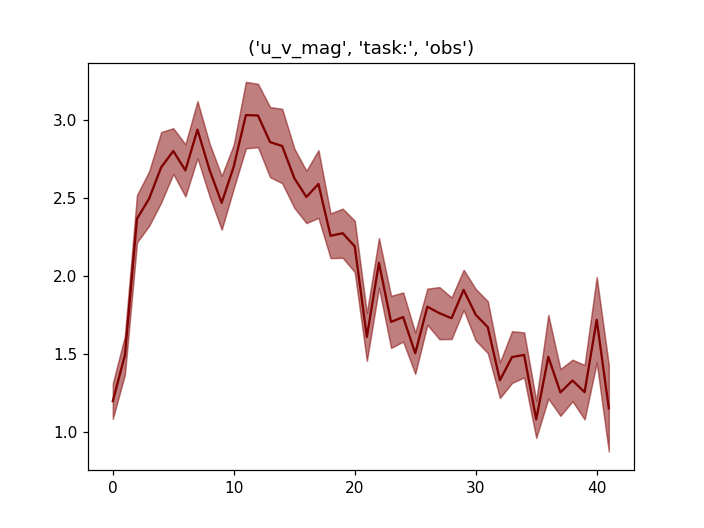

<IPython.core.display.Javascript object>


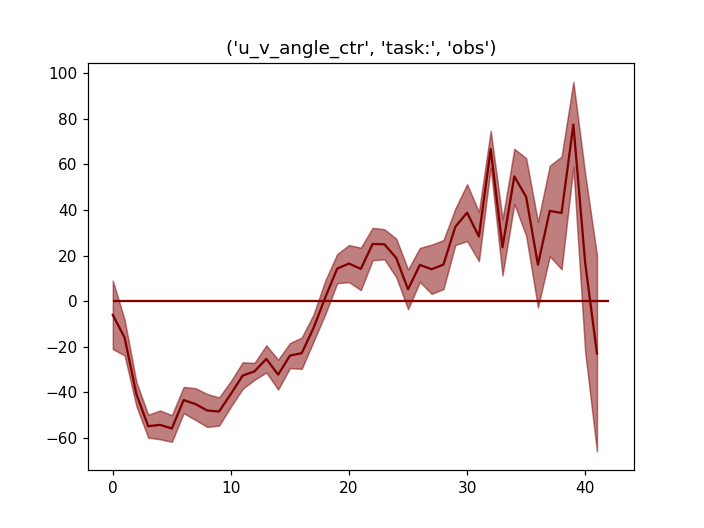

In [34]:
#ALL TARGETS TOGETHER, task separate
ctrl_list = ['p_mag', 'p_angle_ctr', 'v_mag', 'v_angle_ctr', 'u_v_mag', 'u_v_angle_ctr'] #'u_p_mag', 'u_p_angle',
task = 0
# target = 0
plot_trials =False
N_min = 3
plt_len=80

save_bool = False
plt_prefix = 'psth'
plt_ext = ['.png', '.eps']

for task in [0,1]:
    for d in ctrl_list: 
        plt.figure()
        for target in [0]: # range(num_targets):
            len_check = np.where(ctrl_psth[task,target,d,'N']<=N_min)[0]
            if len(len_check)>0:
                plt_len = len_check[0]

            y = ctrl[task,target,d][:plt_len,:]            
            y_mean = ctrl_psth[task,target,d,'mean'][:plt_len]
            y_sem = ctrl_psth[task,target,d,'sem'][:plt_len]    
                
            if 'angle_ctr' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(0,0,plt_len,color=target_color[target])                
            elif 'angle_' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(target_angle[target]*180/np.pi,0,plt_len,color=target_color[target])
            elif d == 'p_mag':
                plt.hlines(target_dist[target],0,plt_len,color=target_color[target])
                plt.hlines(target_dist[target]-target_r,0,plt_len, linestyles='--', color=target_color[target])
                           
            if plot_trials:
                r = plt.plot(y, color='k')
            plt.plot(y_mean, color=target_color[target])
            plt.fill_between(range(len(y)), y_mean-y_sem,y_mean+y_sem,alpha=0.5,color=target_color[target])
        plt.title((d, 'task:', idx2task[task]))
        
        if save_bool: 
            plt_name = plt_prefix + '_' + idx2task[task] + '_' + d
            for ext in plt_ext:
                plt.savefig(os.path.join(save_dir, plt_name+ext))
        

In [17]:
#Determine plot len
#Min number of samples 
psth_len_dic = {}
min_frac = 0.2 #what fraction of trials must be as long as the chosen length
psth_len_dic['min_frac'] = min_frac

for task in range(num_tasks):
    for target in range(num_targets):
        count = psth_dic[task,target,'N']
        min_N = np.ceil(count.max()*min_frac)
        psth_len_dic[task,target,'min_N'] = min_N
        psth_len_dic[task,target] = np.where(count.loc['kin_px']>= min_N)[0][-1]

In [33]:
#Plot a single trial's data.  Confirm the angle representation
#TODO: quiver plot
d = 'u_v_angle'
ctrl[task, target, d].shape

(80L, 27L)

In [194]:
u_v_angle_ctr

<xarray.DataArray (time: 80)>
array([-0.202839,  0.156017, -0.699973,  0.436706, -0.446104, -0.136042,
        0.514126, -0.003546, -0.511283, -0.062431, -0.336987,  0.339664,
        0.284628, -0.571679, -0.449084, -1.795621,  0.212217,  1.213193,
       -0.770745, -0.405895, -0.23218 , -0.157946, -0.461698, -0.261828,
       -0.48135 , -1.140987, -0.396657, -1.736297,  0.728894,  0.548874,
       -2.094726,  1.049824,  2.509065, -1.592579, -2.01744 , -2.208493,
       -0.824679,  0.25524 ,  0.940519,  1.1542  ,  0.030131,  1.250074,
       -1.101896, -2.05276 ,       nan,       nan,       nan,       nan,
             nan,       nan,       nan,       nan,       nan,       nan,
             nan,       nan,       nan,       nan,       nan,       nan,
             nan,       nan,       nan,       nan,       nan,       nan,
             nan,       nan,       nan,       nan,       nan,       nan,
             nan,       nan,       nan,       nan,       nan,       nan,
             nan,    

In [199]:
import scipy.interpolate

<IPython.core.display.Javascript object>


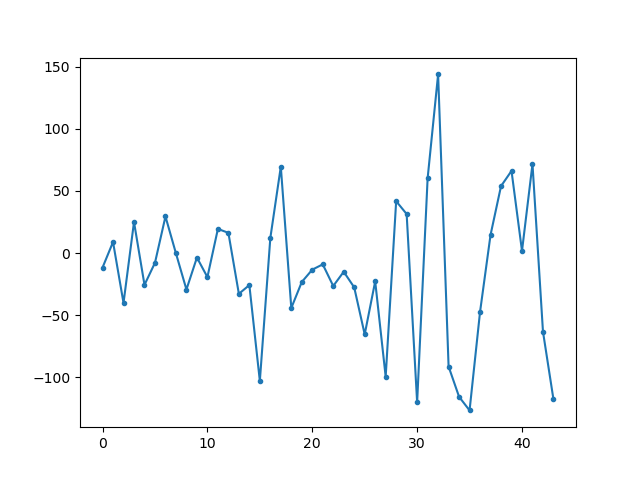

44


In [200]:
#Plot an example trial of angle: 
test = ctrl[0,0,'u_v_angle_ctr'][:,0]*180/np.pi
plt.figure()
plt.plot(test, '.-')
print(np.sum(np.logical_not(np.isnan(np.array(test)))))




In [201]:
np.arange(0,10)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [202]:
data_len = np.sum(np.logical_not(np.isnan(np.array(test))))
f = scipy.interpolate.interp1d(np.arange(0,data_len), test[0:data_len])

In [204]:
test

<xarray.DataArray (time: 80)>
array([ -11.62181 ,    8.939093,  -40.105484,   25.021389,  -25.559868,
         -7.79465 ,   29.457253,   -0.203182,  -29.294378,   -3.577045,
        -19.307911,   19.461295,   16.308   ,  -32.754811,  -25.730617,
       -102.881526,   12.159113,   69.510814,  -44.16046 ,  -23.256069,
        -13.302936,   -9.049661,  -26.453343,  -15.001631,  -27.579296,
        -65.373759,  -22.7268  ,  -99.482479,   41.762527,   31.448179,
       -120.018955,   60.150465,  143.758835,  -91.248058, -115.590779,
       -126.537316,  -47.250606,   14.62417 ,   53.887794,   66.130803,
          1.726379,   71.623969,  -63.134005, -117.614471,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,  

In [209]:
np.linspace(0,43,100)

array([ 0.        ,  0.43434343,  0.86868687,  1.3030303 ,  1.73737374,
        2.17171717,  2.60606061,  3.04040404,  3.47474747,  3.90909091,
        4.34343434,  4.77777778,  5.21212121,  5.64646465,  6.08080808,
        6.51515152,  6.94949495,  7.38383838,  7.81818182,  8.25252525,
        8.68686869,  9.12121212,  9.55555556,  9.98989899, 10.42424242,
       10.85858586, 11.29292929, 11.72727273, 12.16161616, 12.5959596 ,
       13.03030303, 13.46464646, 13.8989899 , 14.33333333, 14.76767677,
       15.2020202 , 15.63636364, 16.07070707, 16.50505051, 16.93939394,
       17.37373737, 17.80808081, 18.24242424, 18.67676768, 19.11111111,
       19.54545455, 19.97979798, 20.41414141, 20.84848485, 21.28282828,
       21.71717172, 22.15151515, 22.58585859, 23.02020202, 23.45454545,
       23.88888889, 24.32323232, 24.75757576, 25.19191919, 25.62626263,
       26.06060606, 26.49494949, 26.92929293, 27.36363636, 27.7979798 ,
       28.23232323, 28.66666667, 29.1010101 , 29.53535354, 29.96

<IPython.core.display.Javascript object>


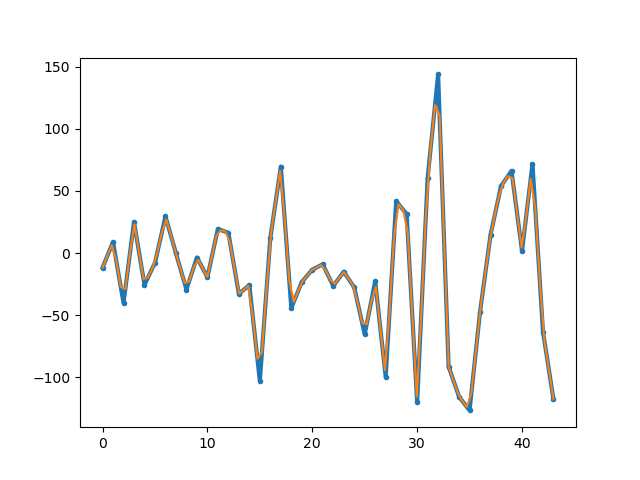

In [211]:
x_interp = np.linspace(0,43,100)
interp_test = f(x_interp)
plt.figure()
plt.plot(test, '.-', linewidth=3)
plt.plot(x_interp, interp_test)

<IPython.core.display.Javascript object>


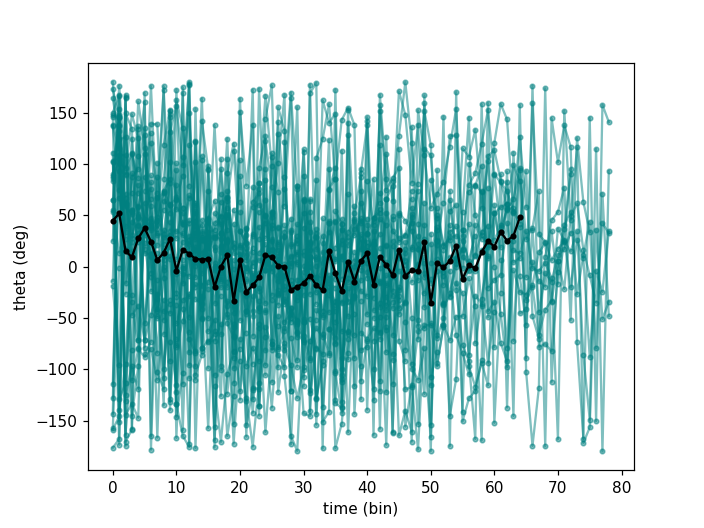

c:\anaconda3\envs\py2\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in less_equal
  app.launch_new_instance()


<IPython.core.display.Javascript object>


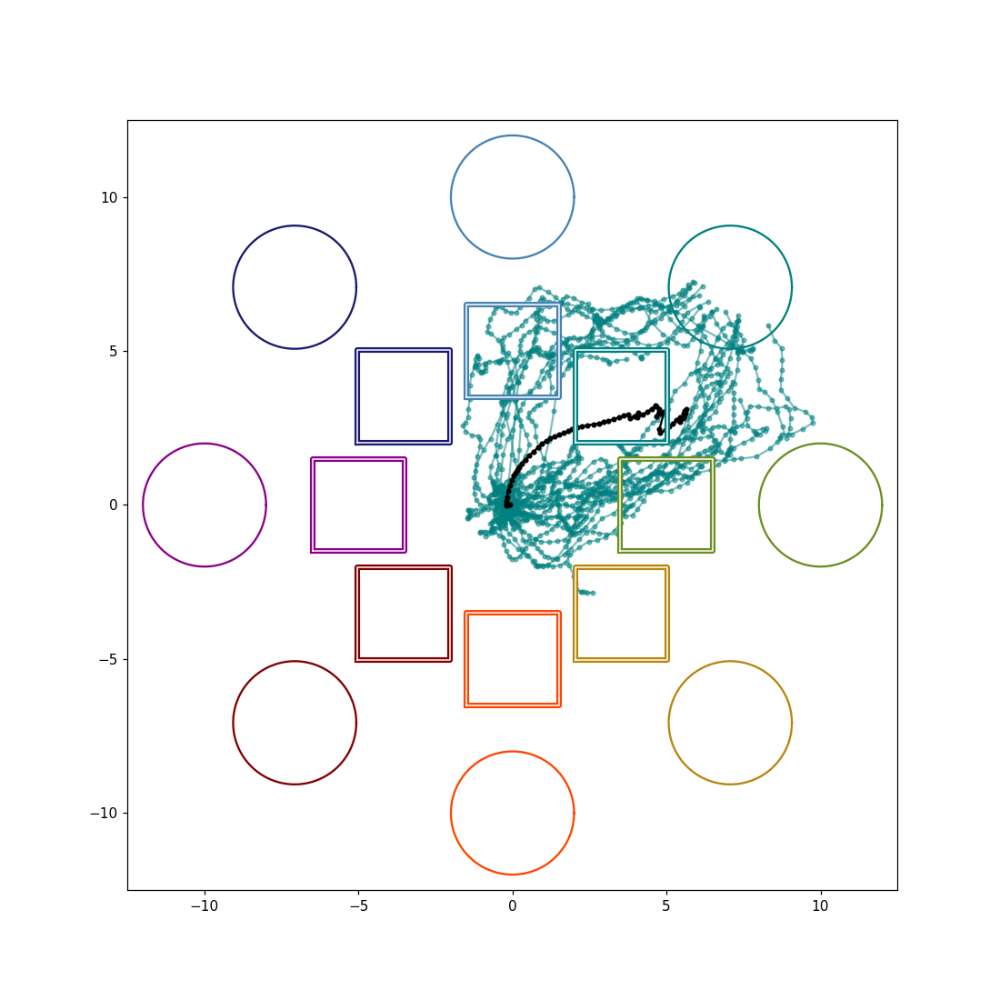

In [187]:
#plot all trials for a task, target up till plt_len
task = 1
target = 4
color = target_color[target]
num_trials = da_dic[task,target].shape[2]
plt_len = psth_len_dic[task,target]

plt_len_vec = []
plt.figure()
for trial in range(num_trials):
    p = da_dic[task,target].loc['kin_px':'kin_py',:(plt_len-1),trial]
    target_error = p-np.tile(target_pos[target,:], [plt_len,1]).T
    dist2target = np.linalg.norm(target_error,axis=0)

    plt_len = psth_len_dic[task,target]
    tmp = np.where(dist2target<=target_r)[0]
    if len(tmp) > 0: 
        plt_len = tmp[0]+1
    plt_len_vec.append(plt_len)

    u_v_angle_ctr = ctrl[task,target,'u_v_angle_ctr'][:plt_len,trial]        
    plt.plot(u_v_angle_ctr*180/np.pi, '.-', color=color, alpha=0.5)
plt_len = int(np.mean(np.array(plt_len_vec)))    
angle_psth = ctrl_psth[task,target,'u_v_angle_ctr','mean'][:plt_len]*180/np.pi
plt.plot(angle_psth,'.-', color='k')
plt.xlabel('time (bin)')
plt.ylabel('theta (deg)')

#-----------------------------------------------------------------------
#plot all trials: 
plt.figure(figsize=plot['size'])

da = da_dic[task,target]
plt_len = int(np.mean(np.array(plt_len_vec)))
x = da.loc['kin_px',:plt_len,:] #num_time X num_trials
y = da.loc['kin_py',:plt_len,:]
color = target_color[target]
plt.plot(x, y, '.-', color=color, alpha=0.5)

#Plot PSTH: 
data = psth_dic[task,target,'mean']
x = data.loc['kin_px'][:plt_len] #num_time X num_trials
y = data.loc['kin_py'][:plt_len]
color = target_color[target]
plt.plot(x, y, '.-', color='k')        

# if plot_obs_small:
#     bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
if plot_obs_big:
    bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
if plot_target: 
    bmi_util.plot_targets(target_pos, target_color, target_r*np.ones(num_targets))  
plt.axis('square')
#     plt.title(task_str)
plt.xlim(plot['xlim'])
plt.ylim(plot['ylim'])
plt.show()


In [175]:
ctrl_psth

{(0,
  0,
  'p_angle',
  'N'): masked_array(data=[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
                    7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 1, 1, 1, 1, 1,
                    1, 1, 1, 1, 1, 1, 1, 1, --, --, --, --, --, --, --, --,
                    --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                    --, --, --, --, --, --, --, --, --, --, --, --, --, --],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False,  True,  True,  True,  True,
                     True,  True,  True,  True,  True,  True,  True,  True,
                     True,  True,  True,  True,  True,  True,

In [179]:
#take the psth of each condition by using the mean length needed to achieve the target
psth_len_dic_v2 = {}
for task in range(num_tasks):
    for target in range(num_targets):
        plt_len_vec = []
        
        num_trials = da_dic[task,target].shape[2]
        for trial in range(num_trials): 
            plt_len = psth_len_dic[task,target]
            p = da_dic[task,target].loc['kin_px':'kin_py',:(plt_len-1),trial]
            target_error = p-np.tile(target_pos[target,:], [plt_len,1]).T
            dist2target = np.linalg.norm(target_error,axis=0)
            tmp = np.where(dist2target<=target_r)[0]
            if len(tmp) > 0: 
                plt_len = tmp[0]+1
            plt_len_vec.append(plt_len)            
            
        plt_len = np.array(plt_len_vec)
        psth_len_dic_v2[task,target,'vec'] = plt_len
        psth_len_dic_v2[task,target] = int(np.mean(plt_len))

c:\anaconda3\envs\py2\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in less_equal
  del sys.path[0]


In [184]:
task = 0
target = 2
for task in range(num_tasks):
    for target in range(num_targets):
        print('task:', task, ' target:', target)
        print(psth_len_dic_v2[task,target,'vec'])
        print(psth_len_dic_v2[task,target])

('task:', 0, ' target:', 0)
[27 25 23 17 25 25 26]
24
('task:', 0, ' target:', 1)
[37 40 24 39 37 45 30 27]
34
('task:', 0, ' target:', 2)
[43 29 31 44 31 36 32 24]
33
('task:', 0, ' target:', 3)
[22 40 52 24 49 48 28 33]
37
('task:', 0, ' target:', 4)
[27 35 36 40 43 31 28 28]
33
('task:', 0, ' target:', 5)
[11 21 24 28 27 37 28 33]
26
('task:', 0, ' target:', 6)
[19 20 25 17 19 18 17 15]
18
('task:', 0, ' target:', 7)
[30 27 22 22 27 20 22 25]
24
('task:', 1, ' target:', 0)
[31 32 28 36 33 33 28 36 33 38 33 28 38 32 40 32 35 36 34 36 34 35 36 35
 39 33 31 33]
33
('task:', 1, ' target:', 1)
[36 33 36 36 36 37 35 36 35 35 41 30 33 39 31 33 34 35 39 23 32 33 34 38
 41 33 34 41]
34
('task:', 1, ' target:', 2)
[41 48 40 41 48 33 34 31 38 36 43 48 32 35 34 46 47 34 33 30 31 31 45 28
 37 48 38 44 31 41]
38
('task:', 1, ' target:', 3)
[62 60 45 53 58 45 48 58 38 48 62 60 36 45 35 50 33 53 50 39 35 36 38 62
 42 30 33 56]
46
('task:', 1, ' target:', 4)
[47 37 42 44 46 43 54 73 34 61 79 66 65 7

In [178]:
psth_len_dic_v2[0,0]

KeyError: (0, 0, 'mean')

<IPython.core.display.Javascript object>


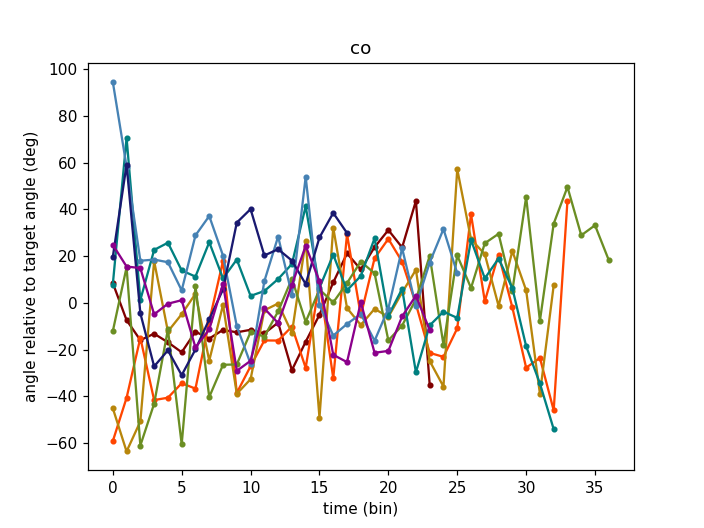

<IPython.core.display.Javascript object>


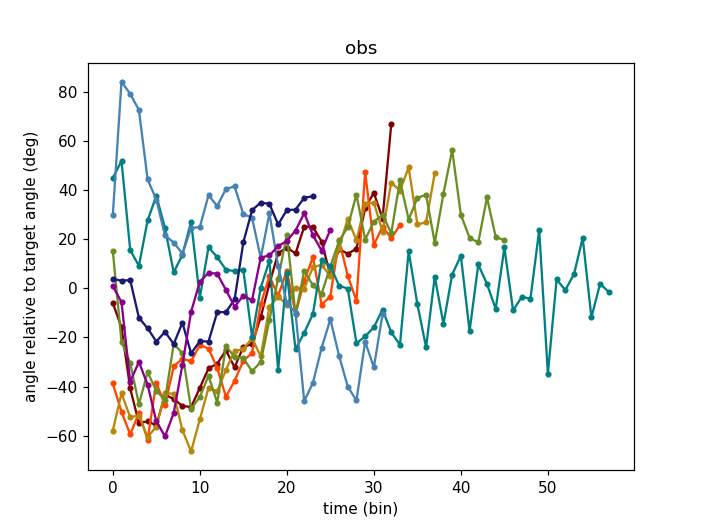

In [189]:
#Plot psth of angle for each task overlaid: 
for task in range(num_tasks):
    plt.figure()
    for target in range(num_targets):
        plt_len = psth_len_dic_v2[task,target]
        angle_psth = ctrl_psth[task,target,'u_v_angle_ctr','mean'][:plt_len]*180/np.pi
        plt.plot(angle_psth, '.-', color=target_color[target])
    plt.title(idx2task[task])
    plt.xlabel('time (bin)')
    plt.ylabel('angle relative to target angle (deg)')
        

In [ ]:
#plot all trials for a task, target up till plt_len
task = 0
target = 4
color = target_color[target]
num_trials = da_dic[task,target].shape[2]
plt_len = psth_len_dic[task,target]

plt_len_vec = []
plt.figure()
for trial in range(num_trials):
    p = da_dic[task,target].loc['kin_px':'kin_py',:(plt_len-1),trial]
    target_error = p-np.tile(target_pos[target,:], [plt_len,1]).T
    dist2target = np.linalg.norm(target_error,axis=0)

    plt_len = psth_len_dic[task,target]
    tmp = np.where(dist2target<=target_r)[0]
    if len(tmp) > 0: 
        plt_len = tmp[0]+1
    plt_len_vec.append(plt_len)

18


c:\anaconda3\envs\py2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in less_equal
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


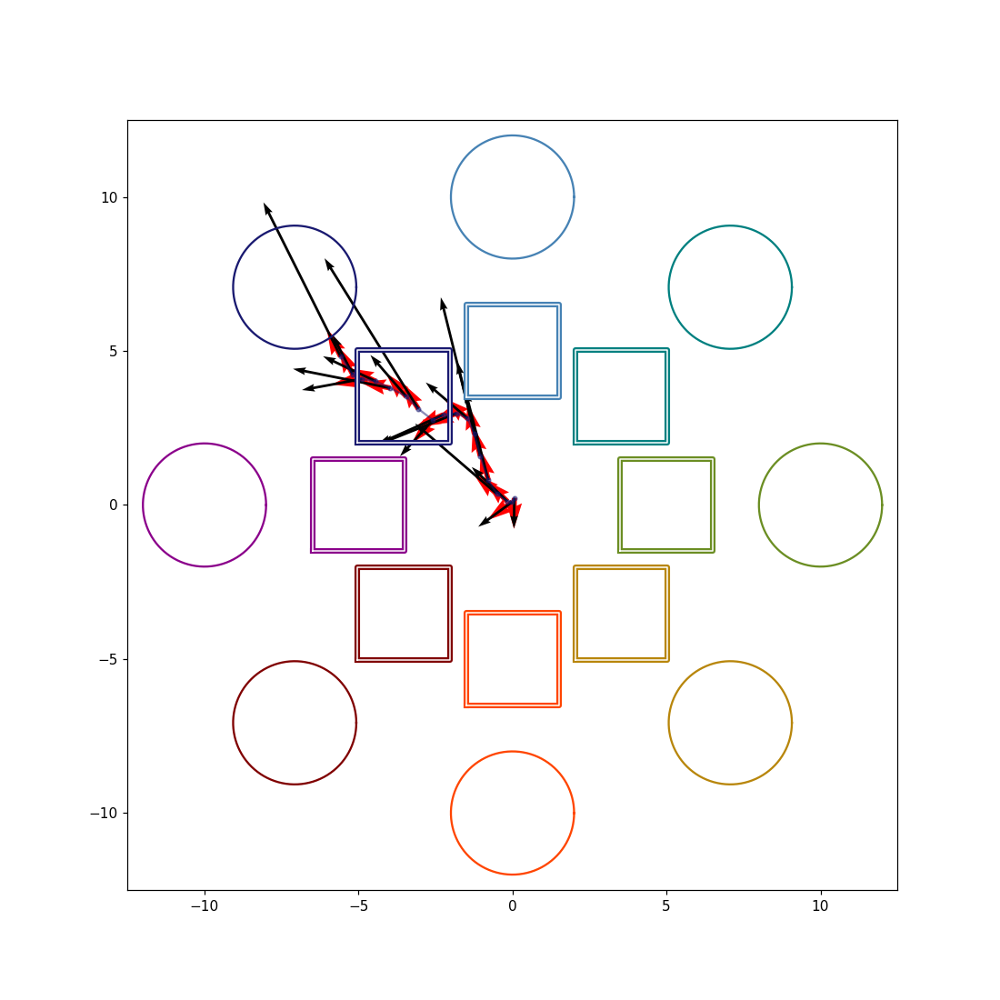

<IPython.core.display.Javascript object>


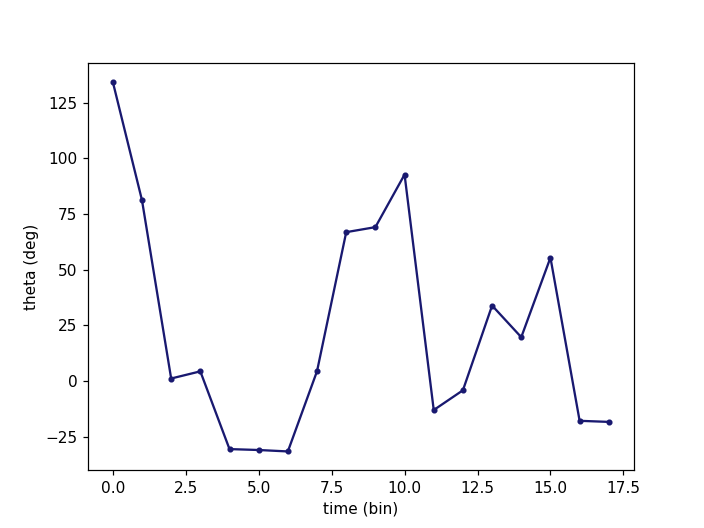

<IPython.core.display.Javascript object>


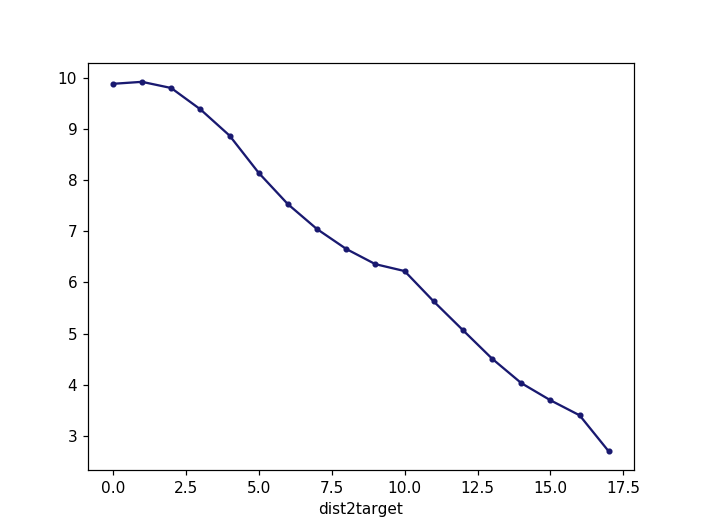

Text(0.5,0,'dist2target')

In [125]:
#PLOT INDIVIDUAL TRIAL:
task = 0
target = 6
trial = 4

plt_len = psth_len_dic[task,target]
p = da_dic[task,target].loc['kin_px':'kin_py',:(plt_len-1),trial]
target_error = p-np.tile(target_pos[target,:], [plt_len,1]).T
dist2target = np.linalg.norm(target_error,axis=0)
tmp = np.where(dist2target<=target_r)[0]
if len(tmp) > 0: 
    plt_len = tmp[0]

print(plt_len)

#PLOT
color = target_color[target]
plot['width'] = 0.005/1.5 #0.005

px = da_dic[task,target].loc['kin_px',:(plt_len-1),trial]
py = da_dic[task,target].loc['kin_py',:(plt_len-1),trial]
#
u_vx = da_dic[task,target].loc['u_vx',:(plt_len-1),trial]
u_vy = da_dic[task,target].loc['u_vy',:(plt_len-1),trial]
#
u_v_angle = ctrl[task,target,'u_v_angle'][:plt_len,trial]
u_v_angle_ctr = ctrl[task,target,'u_v_angle_ctr'][:plt_len,trial]
#
angle_x = np.cos(u_v_angle)
angle_y = np.sin(u_v_angle)

#-----------------------------------------------------------------------------
plt.figure(figsize=plot['size'])
plt.plot(px, py, '.-', color=color, alpha=0.5)
plt.quiver(px, py, angle_x, angle_y, angles='xy', scale=1, scale_units='xy', width=plot['width']*2, color='r', label='angle') #color, label
plt.quiver(px, py, u_vx, u_vy, angles='xy', scale=1, scale_units='xy', width=plot['width'], color='k', label='data') #color, label
if plot_obs_big:
    bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
if plot_target: 
    bmi_util.plot_targets(target_pos, target_color, target_r*np.ones(num_targets))         
plt.axis('square')
#     plt.title(task_str)
plt.xlim(plot['xlim'])
plt.ylim(plot['ylim'])
plt.show()

plt.figure()
plt.plot(u_v_angle_ctr*180/np.pi, '.-', color=color)
plt.xlabel('time (bin)')
plt.ylabel('theta (deg)')

plt.figure()
plt.plot(dist2target[:plt_len],'.-',color=color)
plt.xlabel('time (bin)')
plt.xlabel('dist2target')

<IPython.core.display.Javascript object>


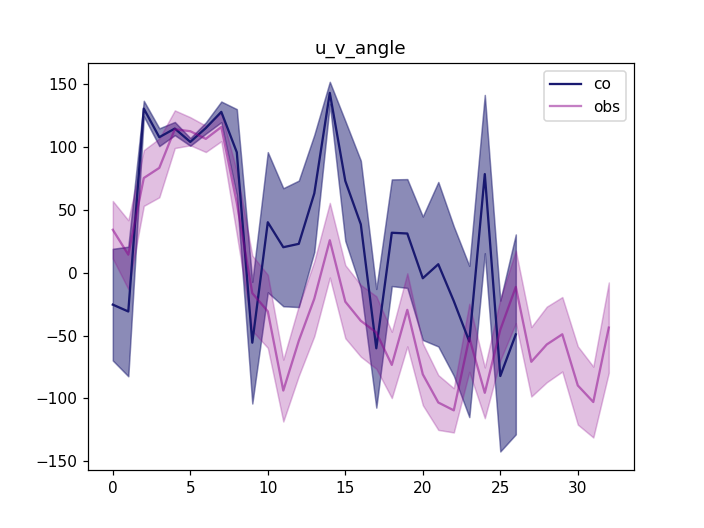

<IPython.core.display.Javascript object>


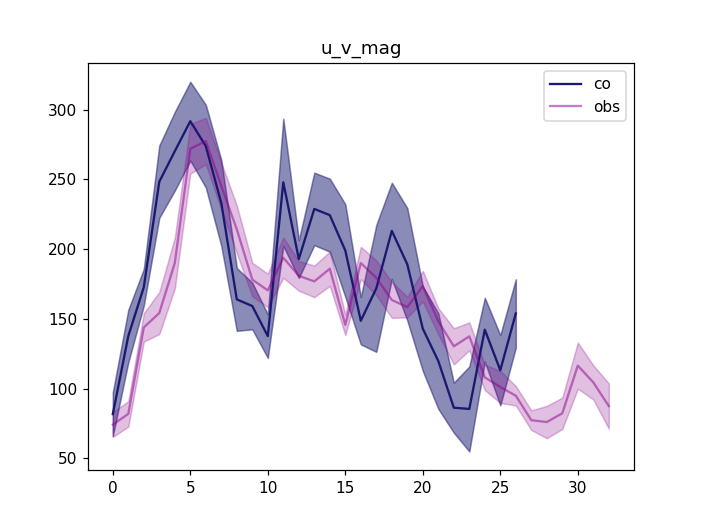

In [32]:
#COMPARE TWO ACROSS-TASK CONDITIONS:
#TODO:
#handle the appropriate length of the psth
#center conditions to the same angle

d_list = ['u_v_angle', 'u_v_mag']

task_target = {0:6, 1:7}
for d in d_list:
    plt.figure()
    for task in range(num_tasks):
        target = task_target[task]
        plt_len = psth_len_dic[task,target]

        y_mean = ctrl_psth[task,target,d,'mean'][:plt_len]*180/np.pi
        y_sem = ctrl_psth[task,target,d,'sem'][:plt_len]*180/np.pi
        plt.plot(y_mean, color=target_color[target],alpha=(1-task*0.5),label=idx2task[task])
        plt.fill_between(range(len(y_mean)), y_mean-y_sem,y_mean+y_sem,alpha=0.5*(1-task*0.5),color=target_color[target])
    plt.legend()
    plt.title(d)

<IPython.core.display.Javascript object>


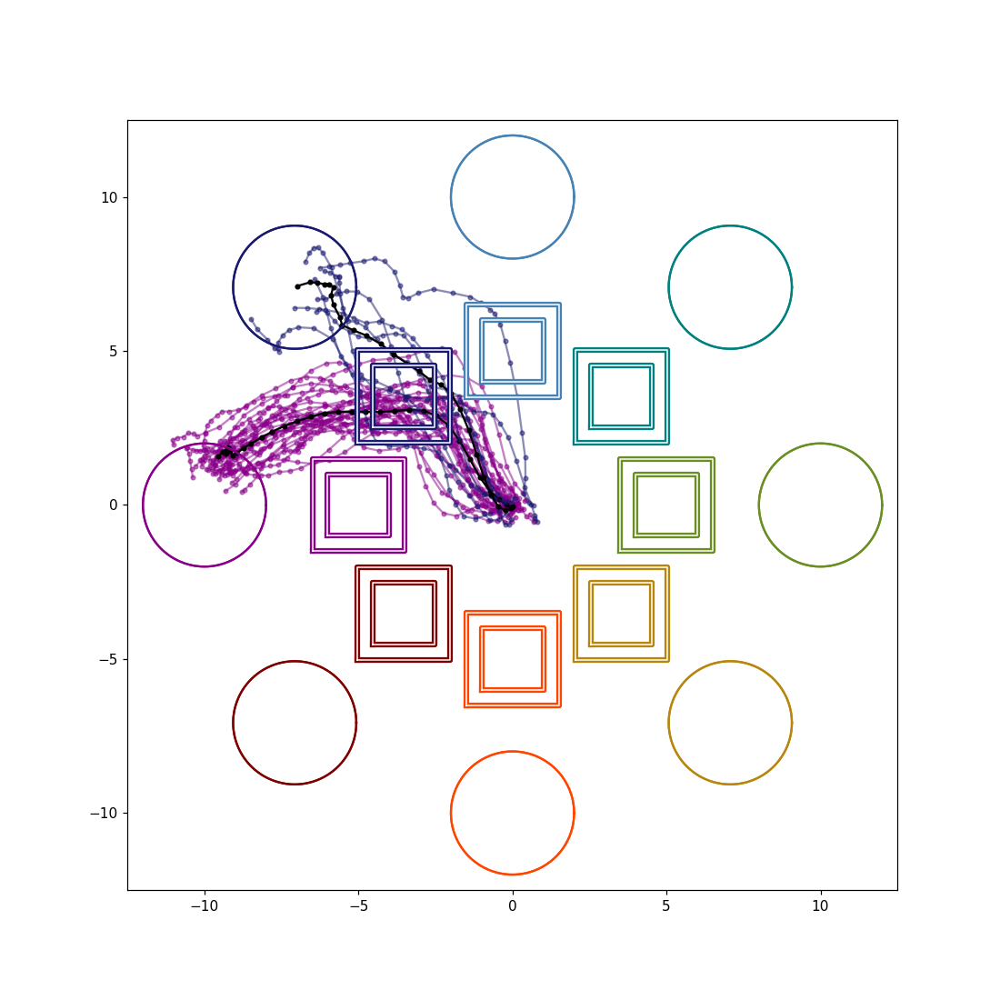

In [30]:

#Plot trials and PSTH: 
#PLOT ALL DATA in da_dic

# plt_prefix = 'trials_p_traj'
# plt_ext = ['.png']

plt.figure(figsize=plot['size'])
for task_str in ['obs', 'co']: # task_list:
    task = task2idx[task_str]
    target = task_target[task]
    plt_len = psth_len_dic[task,target]

    
    da = da_dic[task,target]
    x = da.loc['kin_px',:plt_len,:] #num_time X num_trials
    y = da.loc['kin_py',:plt_len,:]
    color = target_color[target]
    plt.plot(x, y, '.-', color=color, alpha=0.5)

    #Plot PSTH: 
    data = psth_dic[task,target,'mean']
    x = data.loc['kin_px'][:plt_len] #num_time X num_trials
    y = data.loc['kin_py'][:plt_len]
    color = target_color[target]
    plt.plot(x, y, '.-', color='k')        
        
    if plot_obs_small:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_small*np.ones(num_targets))
    if plot_obs_big:
        bmi_util.plot_obstacles(obs_pos, target_color, obs_big*np.ones(num_targets))
    if plot_target: 
        bmi_util.plot_targets(target_pos, target_color, target_r*np.ones(num_targets))  
    
    plt.axis('square')
#     plt.title(task_str)
    plt.xlim(plot['xlim'])
    plt.ylim(plot['ylim'])
    plt.show()
    
# #     plt_name = plt_prefix + '_' + idx2task[task]
# #     for ext in plt_ext:
# #         plt.savefig(os.path.join(save_dir, plt_name+ext))       

In [ ]:
#Confirm single trial of Cartesian and polar
#Quiver at each point the u direction and target direction


<IPython.core.display.Javascript object>


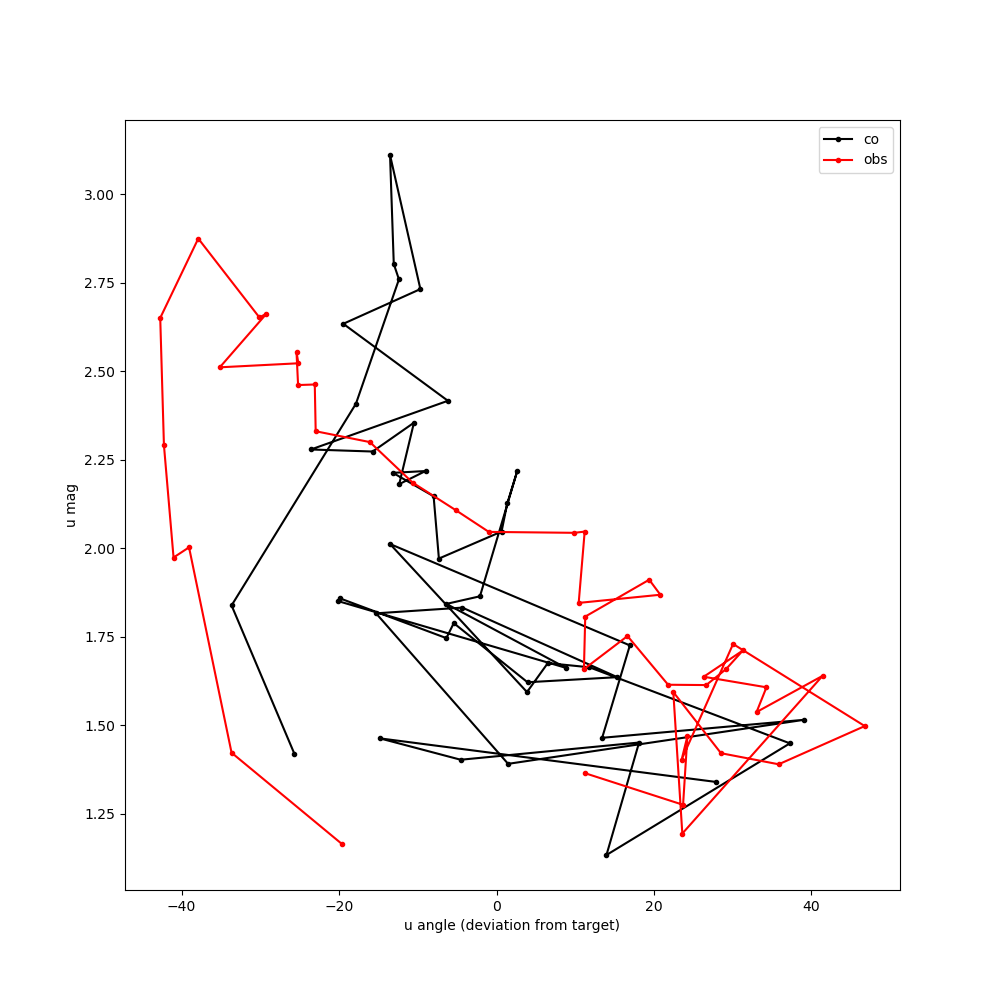

In [19]:
plot_len = 45
plt.figure(figsize=(10,10))
task=0
plt.plot(ctrl_psth[task,'u_v_angle_ctr','mean'][:plot_len]*180/np.pi, ctrl_psth[task,'u_v_mag','mean'][:plot_len], '.-', color=task_color[task], label=idx2task[task])
task=1
plt.plot(ctrl_psth[task,'u_v_angle_ctr','mean'][:plot_len]*180/np.pi, ctrl_psth[task,'u_v_mag','mean'][:plot_len], '.-', color=task_color[task], label=idx2task[task])
plt.xlabel('u angle (deviation from target)')
plt.ylabel('u mag')
plt.legend()


In [28]:
tmp_mat.shape

(8L,)

In [27]:
mean.shape

(80L,)

In [ ]:
        mean = da_dic[task,target].mean(axis=2,skipna=True)
        N = np.logical_not(np.isnan(da_dic[task,target])).sum(axis=2) #number of data points per sample
        var = da_dic[task,target].var(axis=2,skipna=True)
        sem = (var/N)**(0.5)
        
        psth_dic[task,target,'mean'] = mean
        psth_dic[task,target,'N'] = N
        psth_dic[task,target,'var'] = var
        psth_dic[task,target,'sem'] = sem

In [21]:
ctrl_psth.keys()

[(0, 7, 'u_v_angle', 'mean'),
 (1, 4, 'p_angle_ctr', 'mean'),
 (0, 0, 'v_mag', 'mean'),
 (1, 4, 'p_angle_ctr', 'N'),
 (1, 2, 'p_angle', 'var'),
 (1, 0, 'p_mag', 'var'),
 (0, 4, 'v_angle_ctr', 'var'),
 (1, 5, 'u_p_angle', 'mean'),
 (1, 2, 'p_angle', 'N'),
 (1, 6, 'u_v_angle', 'mean'),
 (0, 5, 'p_angle_ctr', 'sem'),
 (1, 0, 'p_angle_ctr', 'N'),
 (1, 4, 'u_p_mag', 'sem'),
 (1, 1, 'v_angle', 'sem'),
 (0, 2, 'p_angle', 'N'),
 (1, 5, 'p_angle', 'N'),
 (0, 4, 'u_p_mag', 'sem'),
 (1, 3, 'p_mag', 'N'),
 (0, 4, 'p_angle_ctr', 'mean'),
 (1, 3, 'v_angle_ctr', 'var'),
 (1, 1, 'u_p_angle', 'N'),
 (1, 5, 'p_angle', 'sem'),
 (1, 2, 'p_angle_ctr', 'mean'),
 (1, 7, 'u_v_mag', 'N'),
 (0, 5, 'u_p_mag', 'N'),
 (1, 3, 'u_p_mag', 'mean'),
 (1, 2, 'p_angle', 'sem'),
 (1, 6, 'u_v_angle_ctr', 'sem'),
 (1, 2, 'u_p_mag', 'N'),
 (1, 3, 'v_angle', 'var'),
 (0, 2, 'p_mag', 'N'),
 (1, 4, 'p_mag', 'sem'),
 (1, 1, 'u_v_angle', 'mean'),
 (0, 7, 'u_v_angle_ctr', 'var'),
 (0, 1, 'v_angle', 'mean'),
 (0, 3, 'u_p_angle_ctr'

In [ ]:
#ALL TARGETS TOGETHER, task separate
ctrl_list = ['p_mag', 'p_angle_ctr', 'v_mag', 'v_angle_ctr', 'u_v_mag', 'u_v_angle_ctr'] #'u_p_mag', 'u_p_angle',
task = 0
# target = 0
plot_trials =False
N_min = 3
plt_len=80

save_bool = False
plt_prefix = 'psth'
plt_ext = ['.png', '.eps']

for task in [0,1]:
    for d in ctrl_list: 
        plt.figure()
        for target in range(num_targets):
            len_check = np.where(ctrl_psth[task,target,d,'N']<=N_min)[0]
            if len(len_check)>0:
                plt_len = len_check[0]

            y = ctrl[task,target,d][:plt_len,:]            
            y_mean = ctrl_psth[task,target,d,'mean'][:plt_len]
            y_sem = ctrl_psth[task,target,d,'sem'][:plt_len]    
                
            if 'angle_ctr' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(0,0,plt_len,color=target_color[target])                
            elif 'angle_' in d:
                y = y*180/np.pi
                y_mean = y_mean*180/np.pi
                y_sem = y_sem*180/np.pi 
                plt.hlines(target_angle[target]*180/np.pi,0,plt_len,color=target_color[target])
            elif d == 'p_mag':
                plt.hlines(target_dist[target],0,plt_len,color=target_color[target])
                plt.hlines(target_dist[target]-target_r,0,plt_len, linestyles='--', color=target_color[target])
                           
            if plot_trials:
                r = plt.plot(y, color='k')
            plt.plot(y_mean, color=target_color[target])
            plt.fill_between(range(len(y)), y_mean-y_sem,y_mean+y_sem,alpha=0.5,color=target_color[target])
        plt.title((d, 'task:', idx2task[task]))
        
        if save_bool: 
            plt_name = plt_prefix + '_' + idx2task[task] + '_' + d
            for ext in plt_ext:
                plt.savefig(os.path.join(save_dir, plt_name+ext))
        

In [ ]:
y = ctrl[0,0,'v_mag']
plt.figure()
r = plt.plot(y)
plt.title('v_mag')

y = ctrl[0,0,'v_angle']
plt.figure()
r = plt.plot(y*180/np.pi)
plt.hlines(target_angle[0]*180/np.pi,0,40,label='target')
plt.legend()
plt.title('v_angle')

In [ ]:
y = ctrl[0,0,'u_p_mag']
plt.figure()
r = plt.plot(y)
plt.title('u_p_mag')

y = ctrl[0,0,'u_p_angle']
plt.figure()
r = plt.plot(y*180/np.pi)
plt.hlines(target_angle[0]*180/np.pi,0,40,label='target')
plt.legend()
plt.title('u_p_angle')